In [2]:
import os
import glob
import time

import pandas as pd
import numpy as np
import xarray as xr
import datetime
import warnings


import matplotlib
from matplotlib import pyplot as plt
from matplotlib.ticker import NullFormatter
matplotlib.rcParams.update({'font.size': 16})
%matplotlib inline
import cartopy.crs as ccrs
import cartopy

from wrfProcessing import *

import sys
p = os.path.abspath('../..')
if p not in sys.path:
    sys.path.append(p)

from tools.generalTools import qsat
SCRATCH='/global/cscratch1/sd/qnicolas/'

import metpy.calc as mpcalc
from metpy.plots import SkewT
from metpy.units import units

In [2]:
xr.set_options(display_style='text') 

# Functions, data

In [3]:
def extract_wrfout(simulation_path,nfiles=30): #default extracts 300 days
    files=sorted(glob.glob(simulation_path+'wrfout_d01_197*'))
    files = files[:min(len(files),nfiles)]
    return xr.open_mfdataset(files,combine='nested',concat_dim='Time',parallel=True)
def extract_wrfpro(simulation_path,nfiles=30): #default extracts 300 days
    files=sorted(glob.glob(simulation_path+'wrfpout_d01_197*'))
    files = files[:min(len(files),nfiles)]
    return xr.open_mfdataset(files,combine='nested',concat_dim='Time',parallel=True)

In [4]:
hrchannel = extract_wrfout('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/')
hrchannel_p = extract_wrfpro('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/')
hrchannelprecip=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.precip.days0-200.nc')
hrchannel_capecin=xr.open_mfdataset(sorted(glob.glob('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.cape.*')),combine='nested',concat_dim='Time',parallel=True).cape_2d

In [5]:
hrchannelprecip_hourly = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.precip.hourly.days0-200.nc')

In [9]:
hrhgt = hrchannel.HGT.isel(south_north=0,Time=-1).persist()
hrdist=(1635-hrhgt.west_east)*3
def plotsection(hgt,figsize=(15,4)):
    fig, ax = plt.subplots(1,1,figsize=figsize)
    ax.set_xlabel("distance west of mountain top (km)")
    ax.set_ylabel("height(m)")
    ax.plot((1635-hgt.west_east)*3,hgt,color='k')
    return ax,ax.twinx()

def f(x):
    return np.sign(x)*x**2

def change_coords_eta(sim,w,center=1635,staggered=0):
    if staggered:
        return w.assign_coords({'distance_from_mtn':(center-w.west_east)*3,'eta_level':sim.ZNW.isel(Time=-1)}).swap_dims({'bottom_top_stag':'eta_level','west_east':'distance_from_mtn'}).persist()
    else:
        return w.assign_coords({'distance_from_mtn':(center-w.west_east)*3,'eta_level':sim.ZNU.isel(Time=-1),'pressure':sim.PB[-1,:,0,:].load()/100}).swap_dims({'bottom_top':'eta_level','west_east':'distance_from_mtn'}).persist()

def change_coords_etav(sim,w,staggered=0):
    if staggered:
        return w.assign_coords({'eta_level':sim.ZNW.isel(Time=-1)}).swap_dims({'bottom_top_stag':'eta_level'}).persist()
    else:
        return w.assign_coords({'eta_level':sim.ZNU.isel(Time=-1),'pressure':sim.PB[-1,:,0,:].load()/100}).swap_dims({'bottom_top':'eta_level'}).persist()

def change_coords_pl(sim,w,center=1635,dx=3):
    return w.assign_coords({'distance_from_mtn':(center-w.west_east)*dx,'pressure':sim.P_PL[0]/100}).swap_dims({'num_press_levels_stag':'pressure','west_east':'distance_from_mtn'}).persist()

def change_coords_press(sim,w):
    return w.assign_coords({'pressure':sim.P_PL[0]/100}).swap_dims({'num_press_levels_stag':'pressure'})

def change_coords_sfc(w,center=1635):
    return w.assign_coords({'distance_from_mtn':(center-w.west_east)*3}).swap_dims({'west_east':'distance_from_mtn'}).persist()

def change_coords_sn(var):
    return var.assign_coords({'distance_ns':3*var.south_north}).swap_dims({'south_north':'distance_ns'})


In [7]:
def plot_skewt(T,q,plevs,skew,color,lbl):
    P = np.array(plevs)* units.hPa
    Tups = units.degK*np.array(T)
    qups = np.array(q)
    Tdups = mpcalc.dewpoint_from_specific_humidity(qups,Tups,P)

    skew.plot(P, Tups,color=color ,label=lbl + " T")
    skew.plot(P, Tdups,color=color , linestyle='--',label=lbl + " Tdew")

    #first non-nan index
    maxcape = np.argmax(~np.isnan(np.array(T)))
    try:
        profups = mpcalc.parcel_profile(P[maxcape:], Tups[maxcape], Tdups[maxcape]).to('degC')
        skew.plot(P[maxcape:], profups, color=color, linestyle=':'  ,label=lbl+ " parcel profile")
        #skew.shade_cape(P[maxcape:], Tups[maxcape:], profups,color=color)
        print(" CAPE = %.1f J/kg"%(mpcalc.cape_cin(P[maxcape:], Tups[maxcape:], Tdups[maxcape:],profups)[0]/units("J/kg")))
    except RuntimeError:
        print('no cape')
    
    skew.ax.set_ylim(1000, 100)
    skew.ax.set_xlim(-40, 50)
    skew.ax.legend()
    skew.plot_dry_adiabats(linewidth=0.5)
    skew.plot_moist_adiabats(linewidth=0.5)

 CAPE = 4560.1 J/kg


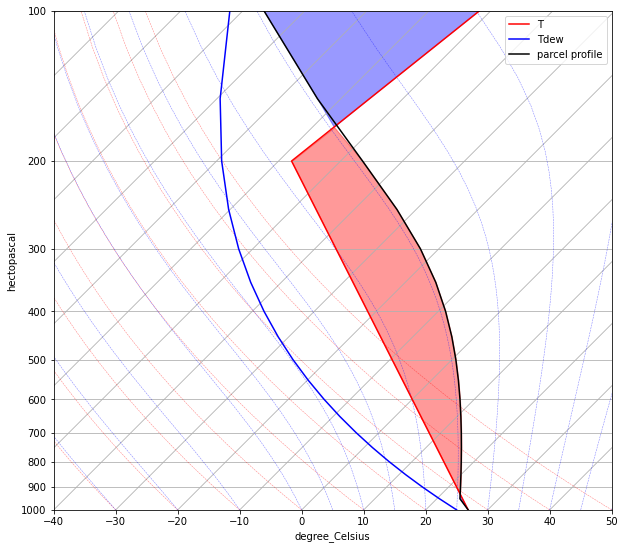

In [13]:
import metpy.calc as mpcalc
from metpy.plots import SkewT
from metpy.units import units
def plot_skewt(T,q,plevs):
    """ Plots a skew-T diagram using metpy
     - T is a 1-D array (or xarray.DataArray) of temperature in K    , ordered by increasing height (or decreasing pressure)
     - q is a 1-D array (or xarray.DataArray) of moisture in kg/kg   , ordered by increasing height (or decreasing pressure)
     - plevs is a 1-D array (or xarray.DataArray) of pressures in hPa, ordered by increasing height (or decreasing pressure)
    """
    fig = plt.figure(figsize=(10,10))
    skew = SkewT(fig, rotation=45)
    
    P = np.array(plevs)* units.hPa
    T = units.degK*np.array(T)
    q = np.array(q)
    Td = mpcalc.dewpoint_from_specific_humidity(q,T,P)

    skew.plot(P, T ,color='r'   ,label="T")
    skew.plot(P, Td,color='b',label="Tdew")

    #first non-nan index
    maxcape = np.argmax(~np.isnan(np.array(T)))
    try:
        profile = mpcalc.parcel_profile(P[maxcape:], T[maxcape], Td[maxcape]).to('degC')
        skew.plot(P[maxcape:], profile, color='k', linestyle='-'  ,label="parcel profile")
        skew.shade_cape(P[maxcape:], T[maxcape:], profile,color='r')
        skew.shade_cin( P[maxcape:], T[maxcape:], profile,color='b')
        print(" CAPE = %.1f J/kg"%(mpcalc.cape_cin(P[maxcape:], T[maxcape:], Td[maxcape:],profile)[0]/units("J/kg")))
    except RuntimeError:
        print('no cape')
    
    skew.ax.set_ylim(1000, 100)
    skew.ax.set_xlim(-40, 50)
    skew.ax.legend()
    skew.plot_dry_adiabats(linewidth=0.5)
    skew.plot_moist_adiabats(linewidth=0.5)
    
p=np.arange(1000,99,-50)
z=-np.log(p/1000)/(9.81/300/287)
q = 0.02*np.exp(-z/2000)
T = 300-6*z/1000
T[-2:] = T[-3]+1*(z[-2:]-z[-3])/1000

plot_skewt(Ts,qs,ps)

In [8]:
def plot_skewt_T(T,plevs,skew,color,lbl):
    P = np.array(plevs)* units.hPa
    Tups = units.degK*np.array(T)
    skew.plot(P, Tups,color=color ,label=lbl + " T")

    skew.ax.set_ylim(1000, 100)
    skew.ax.set_xlim(-40, 50)
    skew.ax.legend()
    skew.plot_dry_adiabats(linewidth=0.5)
    skew.plot_moist_adiabats(linewidth=0.5)

In [9]:
wmean   = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.W_PL.days50-200.nc')
rhomean = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.RHO_PL.days50-200.nc')
qmean   = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.Q_PL.days50-200.nc')
tmean   = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.T_PL.days50-200.nc')
zmean   = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.GHT_PL.days50-100.nc')
rhmean  = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.RH_PL.days150-200.nc')

wmean   = wmean.where(wmean > -100)  
rhomean = rhomean.where(rhomean >0.)  
qmean   = qmean.where(qmean >0.)  
tmean   = tmean.where(tmean >100.)  
omegamean = -9.81*rhomean*wmean
zmean   = zmean.where(zmean >=0.)  
rhmean   = rhmean.where(rhmean >=0.)  

wmean_p =     change_coords_pl(hrchannel_p,wmean)[1:-4]
omegamean_p = change_coords_pl(hrchannel_p,omegamean)[1:-4]
tmean_p =     change_coords_pl(hrchannel_p,tmean)[1:-4]
zmean_p =     change_coords_pl(hrchannel_p,zmean)[1:-4]
qmean_p =     change_coords_pl(hrchannel_p,qmean)[1:-4]
rhmean_p =     change_coords_pl(hrchannel_p,rhmean)[1:-4]

In [10]:
qmean_s   = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.QVAPOR.days50-200.nc')
qmean_s   = change_coords_eta(hrchannel,qmean_s,staggered=0  )
tmean_s   = xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.TEMP.days50-200.nc')
tmean_s   = change_coords_eta(hrchannel,tmean_s,staggered=0  )
    

# Histograms of vertical motion at different locations

In [18]:
base_pressure=hrchannel.PB[-1,:,0,0].load().assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1).load()})/100
base_pressure_stag=xr.DataArray(np.interp(np.array(hrchannel.ZNW[0])[::-1],np.array(hrchannel.ZNU[0])[::-1],np.array(hrchannel.PB[0,:,0,0])[::-1])[::-1]/100,
                                coords={'eta_level':np.array(hrchannel.ZNW[0])},
                                dims=['eta_level']
                               )


In [81]:
base_pressure_stag[6]

<xarray.DataArray ()>
array(859.90355469)
Coordinates:
    eta_level  float32 0.8421

In [50]:
w_sigmas_860={}
for name,slc in zip(["50km","200km","3000km"],[(1645,1655),(1700,1710),(2630,2640)]):
    w=hrchannel.W.isel(west_east=slice(*slc),bottom_top_stag=6)
    w_sigmas_860[name]=np.array(w[200:]).reshape(-1)

In [51]:
w_sigmas_860=w_sigmas

NameError: name 'w_sigmas' is not defined

Proportion of updrafts, 50km    : 53.6%
Proportion of updrafts, 200km   : 50.6%
Proportion of updrafts, 3000km  : 44.5%


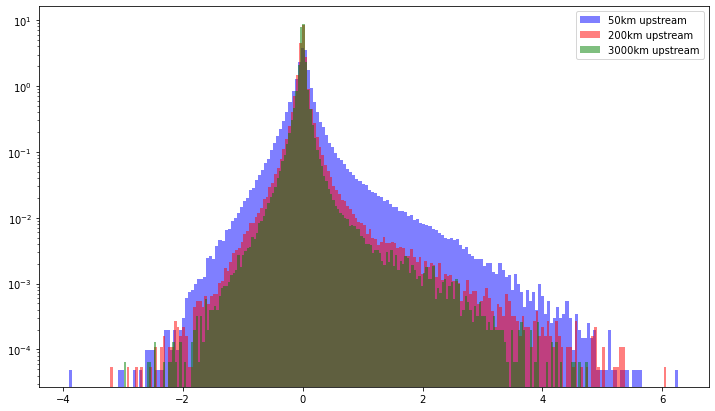

In [64]:
_,ax=plt.subplots(1,1,figsize=(12,7))
clr={"50km":'blue',"200km":'red',"3000km":'green'}
for name,w in w_sigmas_860.items():
    ax.hist(w, bins = 200,color = clr[name],alpha=0.5,density=True,label="%s upstream"%name)
    print("Proportion of updrafts, %-6s  : %.1f%%"%(name,100*(w>0).sum()/len(w)))
ax.set_yscale('log')
ax.legend()

In [89]:
w_sigmas_600={}
for name,slc in zip(["50km","200km","3000km"],[(1645,1655),(1700,1710),(2630,2640)]):
    w=hrchannel.W.isel(west_east=slice(*slc),bottom_top_stag=17)
    w_sigmas_600[name]=np.array(w[200:]).reshape(-1)

Proportion of updrafts, 50km    : 32.2%
Proportion of updrafts, 200km   : 45.2%
Proportion of updrafts, 3000km  : 45.7%


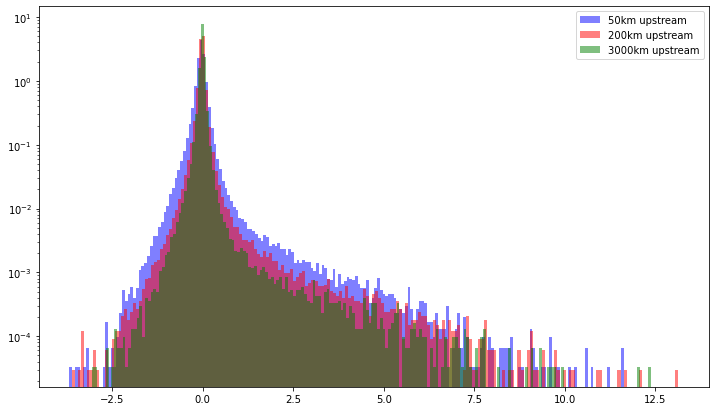

In [90]:
_,ax=plt.subplots(1,1,figsize=(12,7))
clr={"50km":'blue',"200km":'red',"3000km":'green'}
for name,w in w_sigmas_600.items():
    ax.hist(w, bins = 200,color = clr[name],alpha=0.5,density=True,label="%s upstream"%name)
    print("Proportion of updrafts, %-6s  : %.1f%%"%(name,100*(w>0).sum()/len(w)))
ax.set_yscale('log')
ax.legend()

In [91]:
%%time
w_press={}
for name,slc in zip(["50km","200km","3000km"],[1645,1700,2630]):#[(1645,1655),(1700,1710),(2630,2640)]
    w=hrchannel_p.W_PL.isel(west_east=slc,num_press_levels_stag=6)
    w_press[name]=np.array(w[1000:2000]).reshape(-1)

CPU times: user 804 ms, sys: 4min, total: 4min 1s
Wall time: 5min 9s


Proportion of updrafts, 50km    : 63.9%
Proportion of updrafts, 200km   : 51.3%
Proportion of updrafts, 3000km  : 45.2%


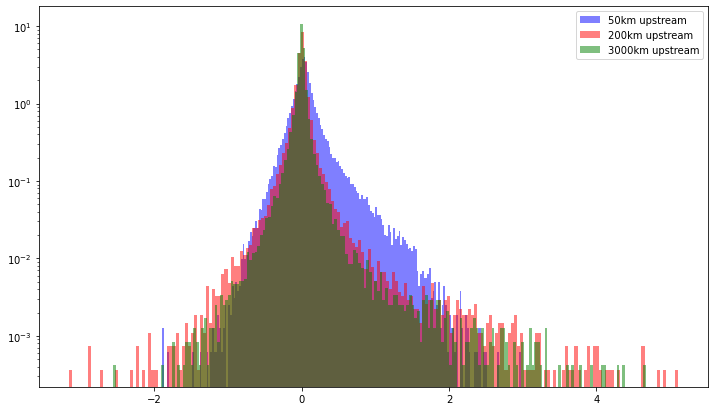

In [92]:
_,ax=plt.subplots(1,1,figsize=(12,7))
clr={"50km":'blue',"200km":'red',"3000km":'green'}
for name,w in w_press.items():
    ax.hist(w, bins = 200,color = clr[name],alpha=0.5,density=True,label="%s upstream"%name)
    print("Proportion of updrafts, %-6s  : %.1f%%"%(name,100*(w>0).sum()/len(w)))
ax.set_yscale('log')
ax.legend()

# Tracking a time of strong convection

In [10]:
%%time
w_event = change_coords_sn(change_coords_pl(hrchannel_p,hrchannel_p.W_PL.isel(Time=slice(152*24+10,153*24+6)).squeeze())).sel(distance_from_mtn=slice(100,-600)).persist()

CPU times: user 198 ms, sys: 4.27 s, total: 4.47 s
Wall time: 5.67 s


In [11]:
%%time
t_event = change_coords_sn(change_coords_pl(hrchannel_p,hrchannel_p.T_PL.isel(Time=slice(152*24+10,153*24+6)).squeeze())).sel(distance_from_mtn=slice(100,-600)).persist()

CPU times: user 255 ms, sys: 802 ms, total: 1.06 s
Wall time: 1.11 s


In [12]:
%%time
q_event = change_coords_sn(change_coords_pl(hrchannel_p,hrchannel_p.Q_PL.isel(Time=slice(152*24+10,153*24+6)).squeeze())).sel(distance_from_mtn=slice(100,-600)).persist()

CPU times: user 299 ms, sys: 874 ms, total: 1.17 s
Wall time: 1.7 s


In [13]:
%%time
rh_event = change_coords_sn(change_coords_pl(hrchannel_p,hrchannel_p.RH_PL.isel(Time=slice(152*24+10,153*24+6)).squeeze())).sel(distance_from_mtn=slice(100,-600)).persist()

CPU times: user 274 ms, sys: 914 ms, total: 1.19 s
Wall time: 1.19 s


## With 500hPa W

Text(0.5, 0, 'Distance from mountain peak (km)')

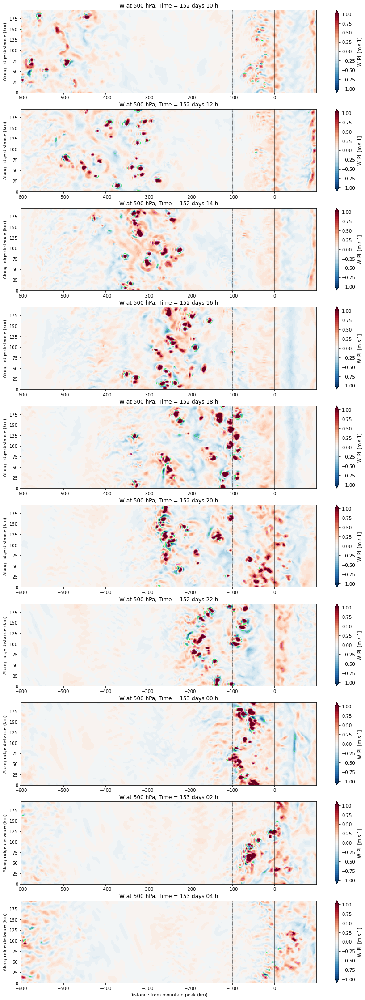

In [10]:
n=2;wscale=1
fig,axs = plt.subplots(20//n,1,figsize=(15,4*20//n))
for i,ax in enumerate(axs):
    ax.axvline(   0.,color='k',linewidth=0.5)
    ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
    #ax.axvline( 100.,color='k',linewidth=0.5,linestyle='--')
    w_event.sel(pressure=500.).isel(Time=i*n).plot.contourf(ax=ax,levels=np.linspace(-wscale,wscale,41))#,add_colorbar=False
    w_event.sel(pressure=500.).isel(Time=i*n).plot.contour(ax=ax,levels=[.5,-.5],colors=['lime','violet'],linewidths=0.5)
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.set_ylabel("Along-ridge distance (km)")
    j = i*n+10
    ax.set_title("W at 500 hPa, Time = %i days %02i h"%(152+j//24,j%24))
ax.set_xlabel("Distance from mountain peak (km)")

### Data loading

In [168]:
t_upd=(t_event*(w_event.sel(pressure=500.)>.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)>.5).mean(["Time","distance_ns"])
t_dwn=(t_event*(w_event.sel(pressure=500.)<-.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)<-.5).mean(["Time","distance_ns"])
t_env=(t_event*(w_event.sel(pressure=500.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])/((w_event.sel(pressure=500.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])
t_upd=t_upd.persist()
t_dwn=t_dwn.persist()
t_env=t_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [169]:
rh_upd=(rh_event*(w_event.sel(pressure=500.)>.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)>.5).mean(["Time","distance_ns"])
rh_dwn=(rh_event*(w_event.sel(pressure=500.)<-.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)<-.5).mean(["Time","distance_ns"])
rh_env=(rh_event*(w_event.sel(pressure=500.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])/((w_event.sel(pressure=500.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])
rh_upd=rh_upd.persist()
rh_dwn=rh_dwn.persist()
rh_env=rh_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [170]:
rh_upd2=(rh_event*(w_event.sel(pressure=500.)>1)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)>1).mean(["Time","distance_ns"])
rh_dwn2=(rh_event*(w_event.sel(pressure=500.)<-1)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)<-1).mean(["Time","distance_ns"])
rh_env2=(rh_event*(w_event.sel(pressure=500.)>-1)*(w_event.sel(pressure=500.)<1)).mean(["Time","distance_ns"])/((w_event.sel(pressure=500.)>-1)*(w_event.sel(pressure=500.)<1)).mean(["Time","distance_ns"])
rh_upd2=rh_upd2.persist()
rh_dwn2=rh_dwn2.persist()
rh_env2=rh_env2.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [171]:
w_upd=(w_event*(w_event.sel(pressure=500.)>.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)>.5).mean(["Time","distance_ns"])
w_dwn=(w_event*(w_event.sel(pressure=500.)<-.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=500.)<-.5).mean(["Time","distance_ns"])
w_env=(w_event*(w_event.sel(pressure=500.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])/((w_event.sel(pressure=500.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])
w_upd=w_upd.persist()
w_dwn=w_dwn.persist()
w_env=w_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


### Plots

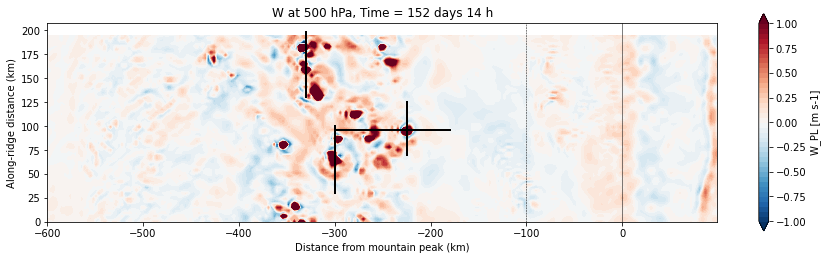

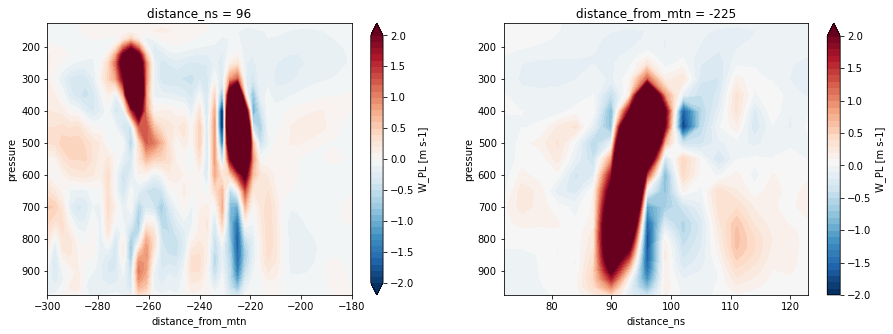

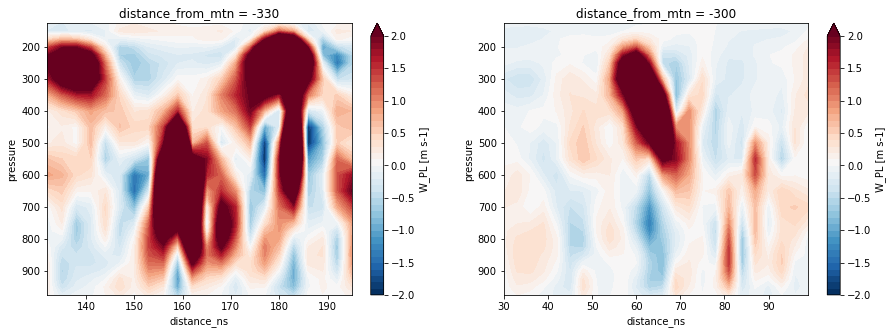

In [12]:
wscale=1
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax.axvline(   0.,color='k',linewidth=0.5)
ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
w_event[4].sel(pressure=500.).plot.contourf(ax=ax,levels=np.linspace(-wscale,wscale,41))
ax.set_aspect("equal")
ax.set_xlabel("Distance from mountain peak (km)")
ax.set_ylabel("Along-ridge distance (km)")
ax.set_title("W at 500 hPa, Time = 152 days 14 h")
ax.plot([-300,-180],[96,96],color='k',linewidth=2)
ax.plot([-225,-225],[70,125],color='k',linewidth=2)
ax.plot([-300,-300],[30,100],color='k',linewidth=2)
ax.plot([-330,-330],[130,198],color='k',linewidth=2)

wscale=2
fig,axs = plt.subplots(1,2,figsize=(15,5))
ax=axs[0]
w_event[4,1:-4].sel(distance_ns=96,distance_from_mtn=slice(-180,-300)).plot.contourf(ax=ax,y='pressure',yincrease=False,levels=np.linspace(-wscale,wscale,41))
ax=axs[1]
w_event[4,1:-4].sel(distance_ns=slice(70,125),distance_from_mtn=-225).plot.contourf(ax=ax,y='pressure',yincrease=False ,levels=np.linspace(-wscale,wscale,41))

fig,axs = plt.subplots(1,2,figsize=(15,5))
ax=axs[0]
w_event[4,1:-4].sel(distance_ns=slice(130,200),distance_from_mtn=-330).plot.contourf(ax=ax,y='pressure',yincrease=False,levels=np.linspace(-wscale,wscale,41))
ax=axs[1]
w_event[4,1:-4].sel(distance_ns=slice(30,100),distance_from_mtn=-300).plot.contourf(ax=ax,y='pressure',yincrease=False ,levels=np.linspace(-wscale,wscale,41))


Proportion of updrafts/downdrafts by longitude&time

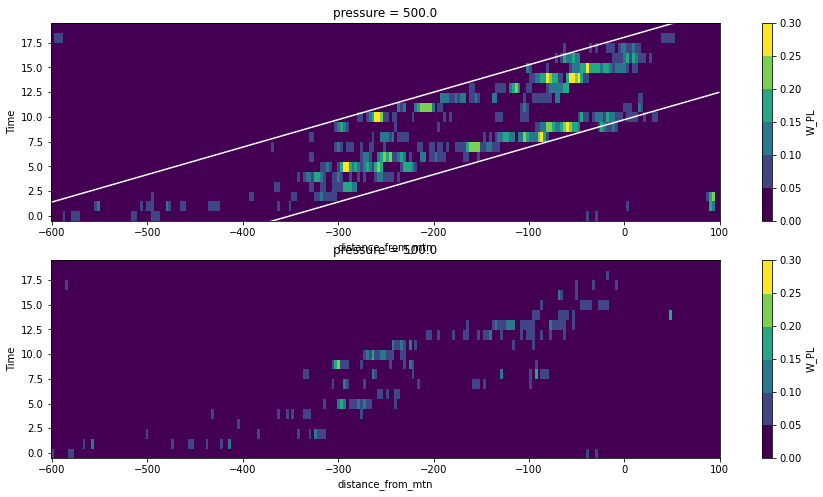

In [69]:
fig,ax = plt.subplots(2,1,figsize=(15,8))
(w_event.sel(pressure=500.)>.5).mean('distance_ns').plot(ax=ax[0],levels=np.arange(0,0.31,0.05))
(w_event.sel(pressure=500.)<-.5).mean('distance_ns').plot(ax=ax[1],levels=np.arange(0,0.31,0.05))
ax[0].plot(w_event.distance_from_mtn,(w_event.distance_from_mtn+650)/(10/1000*3600),color='w')
ax[0].plot(w_event.distance_from_mtn,(w_event.distance_from_mtn+350)/(10/1000*3600),color='w')

Text(0.5, 0.98, 'Temperature')

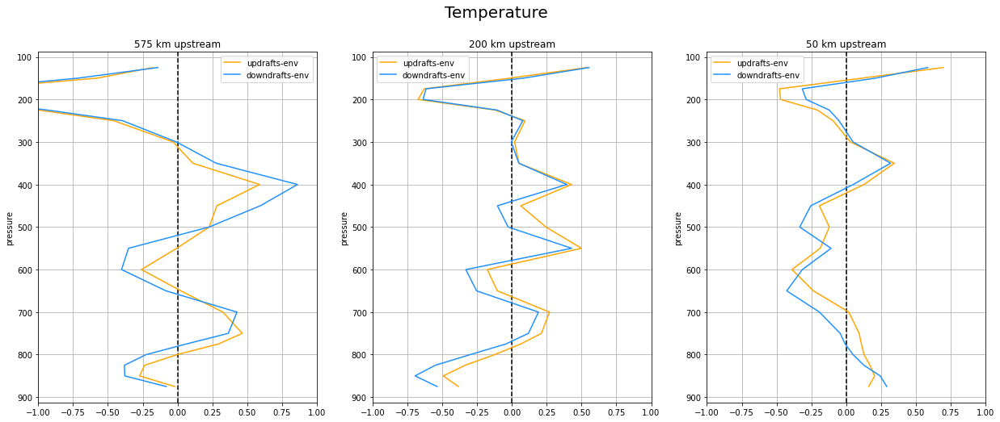

In [179]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (t_upd-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="orange",label="updrafts-env")
    (t_dwn-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="dodgerblue",label="downdrafts-env")
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-1,1)
    ax.grid()
fig.suptitle("Temperature",fontsize=20)


Text(0.5, 0.98, 'Relative humidity')

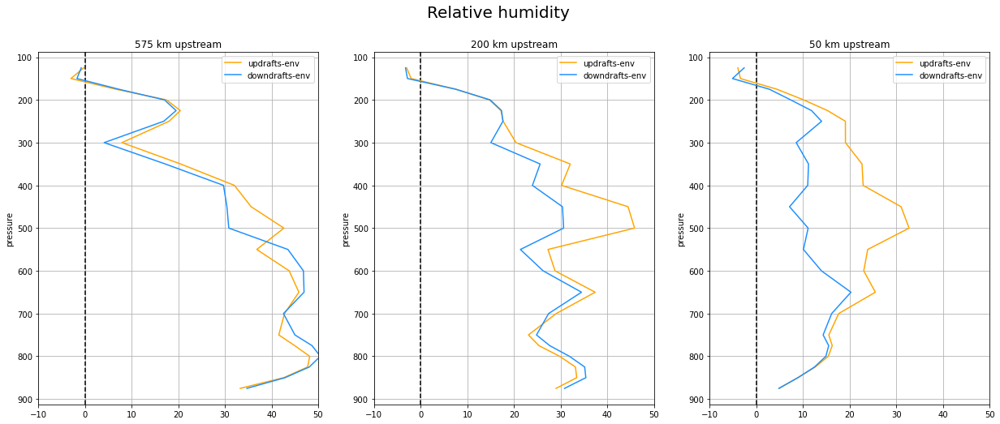

In [180]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (rh_upd-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="orange",label="updrafts-env")
    (rh_dwn-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="dodgerblue",label="downdrafts-env")
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-10,50)
    ax.grid()
fig.suptitle("Relative humidity",fontsize=20)


Text(0.5, 0.98, 'Relative humidity')

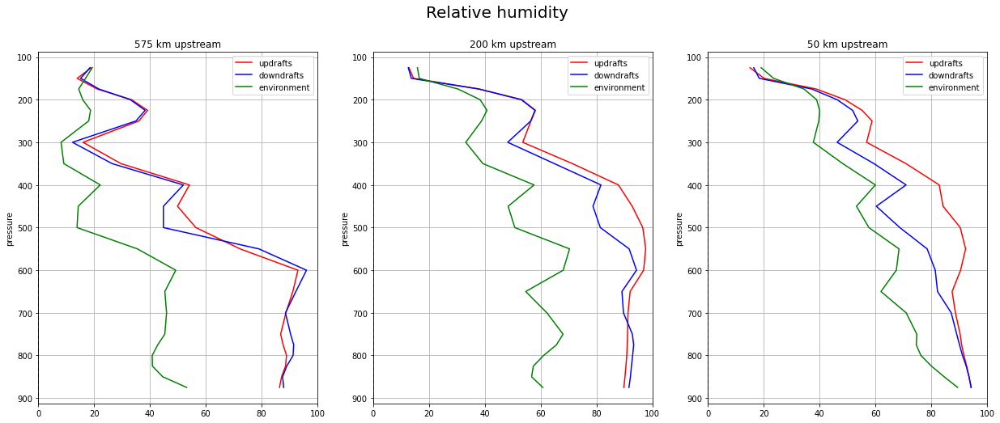

In [181]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    rh_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',label='updrafts')
    rh_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',label='downdrafts')
    rh_env.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',label='environment')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(0,100)
    ax.grid()
fig.suptitle("Relative humidity",fontsize=20)

### Extra plots

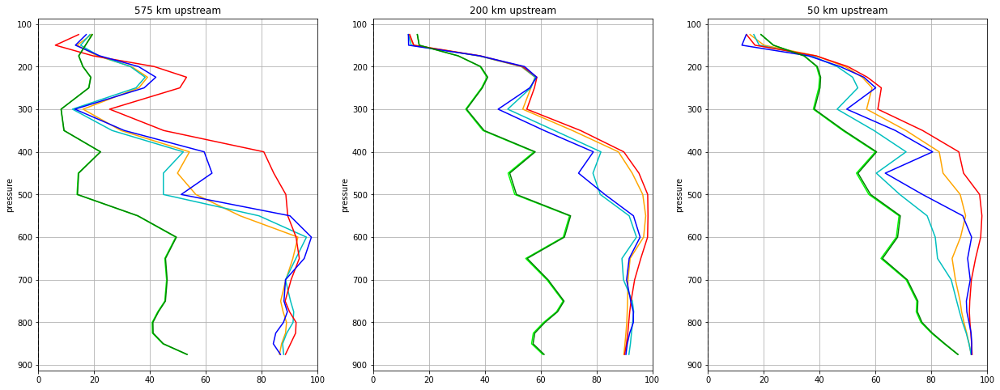

In [182]:
_,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    rh_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='orange')
    rh_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='c')
    rh_env.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='lime')
    rh_upd2.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r')
    rh_dwn2.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b')
    rh_env2.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.set_xlim(0,100)
    ax.grid()

Text(0.5, 0.98, 'W')

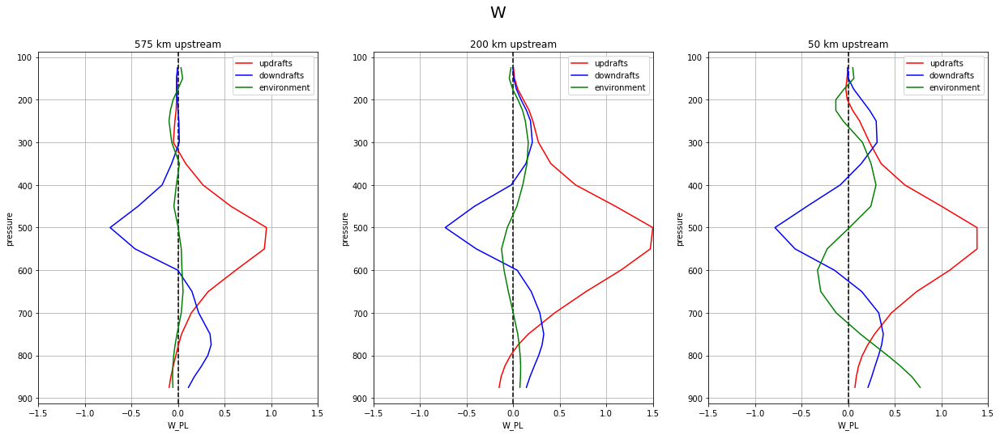

In [184]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    w_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',label='updrafts')
    w_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',label='downdrafts')
    (10*w_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',label='environment')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-1.5,1.5)
    ax.grid()
fig.suptitle("W",fontsize=20)

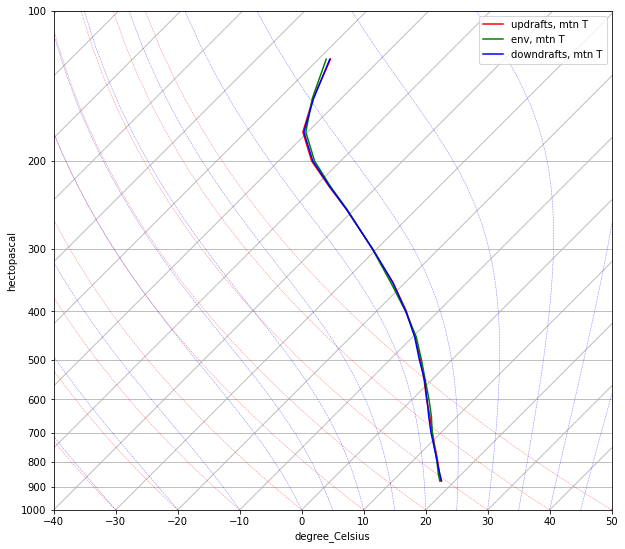

In [25]:
fig = plt.figure(figsize=(10,10))
skew = SkewT(fig, rotation=45)
plot_skewt_T(t_upd.sel(distance_from_mtn=slice(-25,-75)).mean('distance_from_mtn')[5:-4],t_upd.pressure[5:-4],skew,"r","updrafts, mtn")
plot_skewt_T(t_env.sel(distance_from_mtn=slice(-25,-75)).mean('distance_from_mtn')[5:-4],t_upd.pressure[5:-4],skew,"g","env, mtn")
plot_skewt_T(t_dwn.sel(distance_from_mtn=slice(-25,-75)).mean('distance_from_mtn')[5:-4],t_upd.pressure[5:-4],skew,"b","downdrafts, mtn")



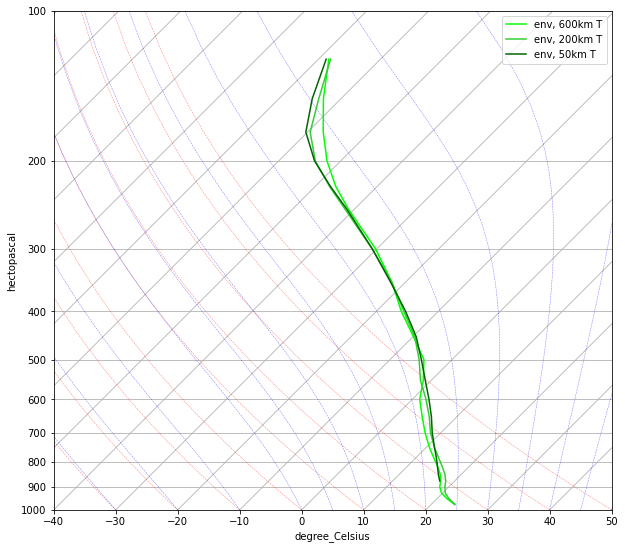

In [26]:
fig = plt.figure(figsize=(10,10))
skew = SkewT(fig, rotation=45)
plot_skewt_T(t_env.sel(distance_from_mtn=slice(-550,-600)).mean('distance_from_mtn')[1:-4],t_upd.pressure[1:-4],skew,"lime","env, 600km")
plot_skewt_T(t_env.sel(distance_from_mtn=slice(-175,-225)).mean('distance_from_mtn')[1:-4],t_upd.pressure[1:-4],skew,"limegreen","env, 200km")
plot_skewt_T(t_env.sel(distance_from_mtn=slice(-25,-75)).mean('distance_from_mtn')[5:-4],t_upd.pressure[5:-4],skew,"darkgreen","env, 50km")


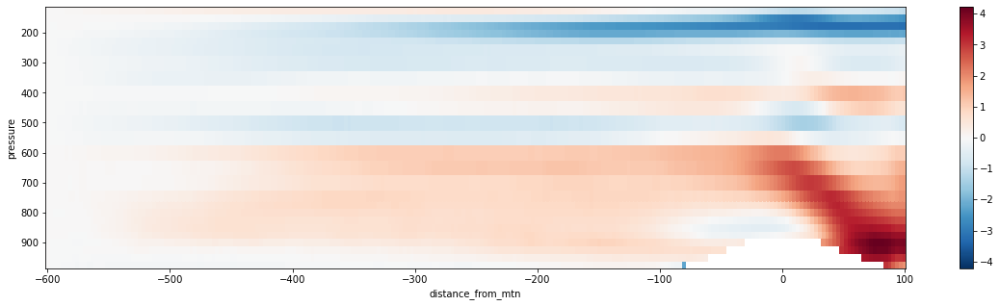

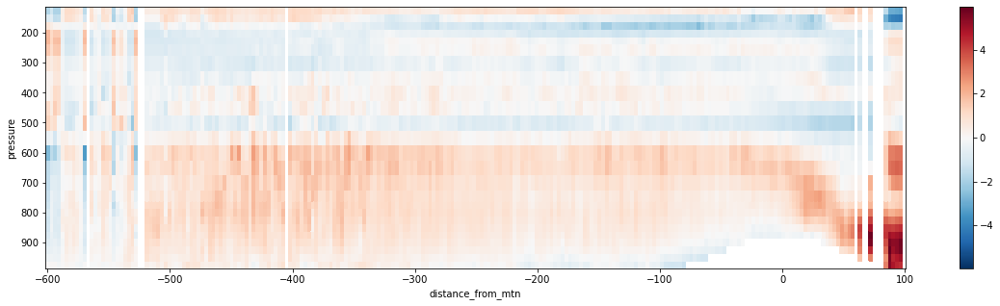

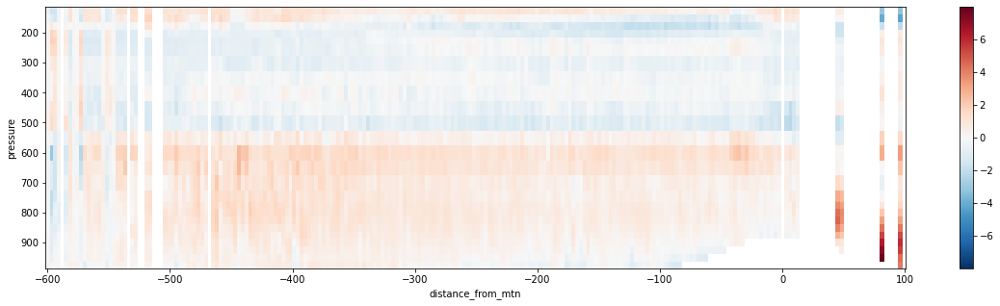

In [27]:
plt.figure(figsize=(20,5))
deltaT=(t_env[1:-4]-t_env[1:-4,-1])
deltaT.where(deltaT>-10).plot(y='pressure',yincrease=False)

plt.figure(figsize=(20,5))
deltaT=(t_upd[1:-4]-t_upd[1:-4,-20:-1].mean('distance_from_mtn'))
deltaT.where(deltaT>-10).plot(y='pressure',yincrease=False)

plt.figure(figsize=(20,5))
deltaT=(t_dwn[1:-4]-t_dwn[1:-4,-20:-1].mean('distance_from_mtn'))
deltaT.where(deltaT>-10).plot(y='pressure',yincrease=False)

## With 850hPa W

Text(0.5, 0, 'Distance from mountain peak (km)')

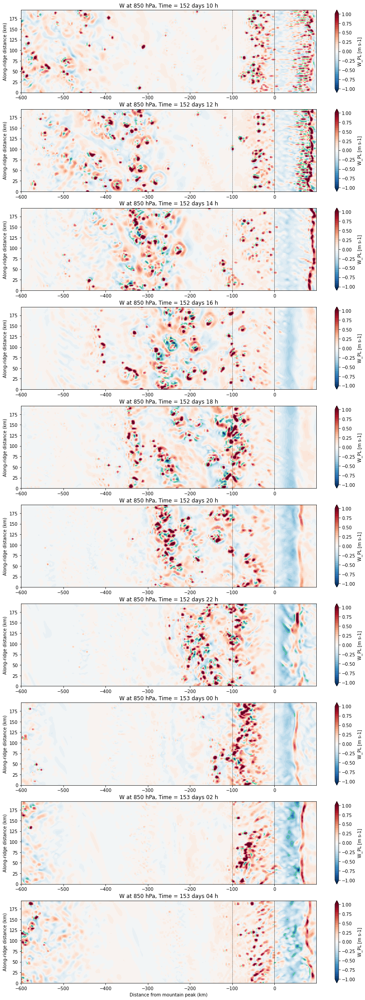

In [28]:
n=2;wscale=1
fig,axs = plt.subplots(20//n,1,figsize=(15,4*20//n))
for i,ax in enumerate(axs):
    ax.axvline(   0.,color='k',linewidth=0.5)
    ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
    #ax.axvline( 100.,color='k',linewidth=0.5,linestyle='--')
    w_event.sel(pressure=850.).isel(Time=i*n).plot.contourf(ax=ax,levels=np.linspace(-wscale,wscale,41))#,add_colorbar=False
    w_event.sel(pressure=850.).isel(Time=i*n).plot.contour(ax=ax,levels=[.5,-.5],colors=['lime','violet'],linewidths=0.5)
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.set_ylabel("Along-ridge distance (km)")
    j = i*n+10
    ax.set_title("W at 850 hPa, Time = %i days %02i h"%(152+j//24,j%24))
ax.set_xlabel("Distance from mountain peak (km)")

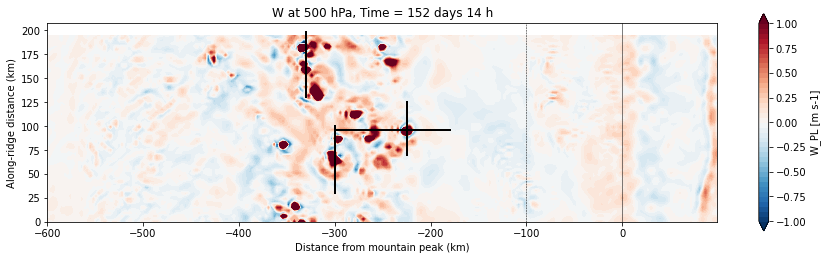

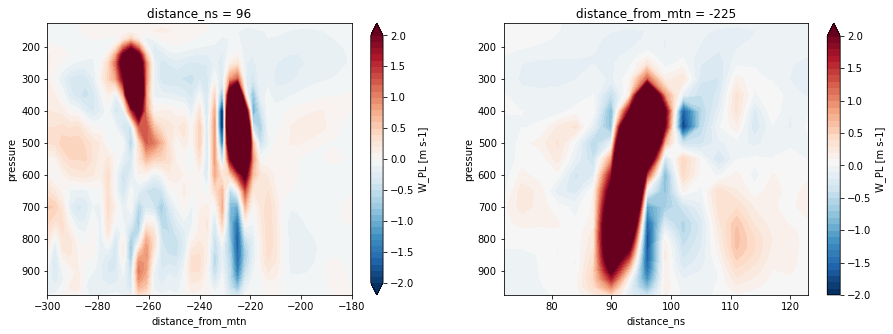

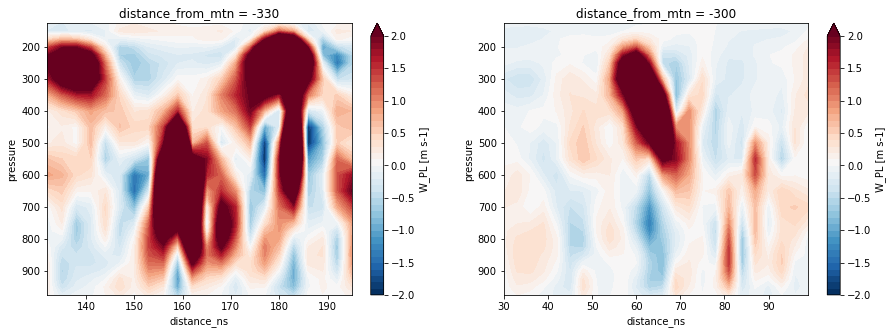

In [12]:
wscale=1
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax.axvline(   0.,color='k',linewidth=0.5)
ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
w_event[4].sel(pressure=500.).plot.contourf(ax=ax,levels=np.linspace(-wscale,wscale,41))
ax.set_aspect("equal")
ax.set_xlabel("Distance from mountain peak (km)")
ax.set_ylabel("Along-ridge distance (km)")
ax.set_title("W at 500 hPa, Time = 152 days 14 h")
ax.plot([-300,-180],[96,96],color='k',linewidth=2)
ax.plot([-225,-225],[70,125],color='k',linewidth=2)
ax.plot([-300,-300],[30,100],color='k',linewidth=2)
ax.plot([-330,-330],[130,198],color='k',linewidth=2)

wscale=2
fig,axs = plt.subplots(1,2,figsize=(15,5))
ax=axs[0]
w_event[4,1:-4].sel(distance_ns=96,distance_from_mtn=slice(-180,-300)).plot.contourf(ax=ax,y='pressure',yincrease=False,levels=np.linspace(-wscale,wscale,41))
ax=axs[1]
w_event[4,1:-4].sel(distance_ns=slice(70,125),distance_from_mtn=-225).plot.contourf(ax=ax,y='pressure',yincrease=False ,levels=np.linspace(-wscale,wscale,41))

fig,axs = plt.subplots(1,2,figsize=(15,5))
ax=axs[0]
w_event[4,1:-4].sel(distance_ns=slice(130,200),distance_from_mtn=-330).plot.contourf(ax=ax,y='pressure',yincrease=False,levels=np.linspace(-wscale,wscale,41))
ax=axs[1]
w_event[4,1:-4].sel(distance_ns=slice(30,100),distance_from_mtn=-300).plot.contourf(ax=ax,y='pressure',yincrease=False ,levels=np.linspace(-wscale,wscale,41))


Proportion of updrafts/downdrafts by longitude&time

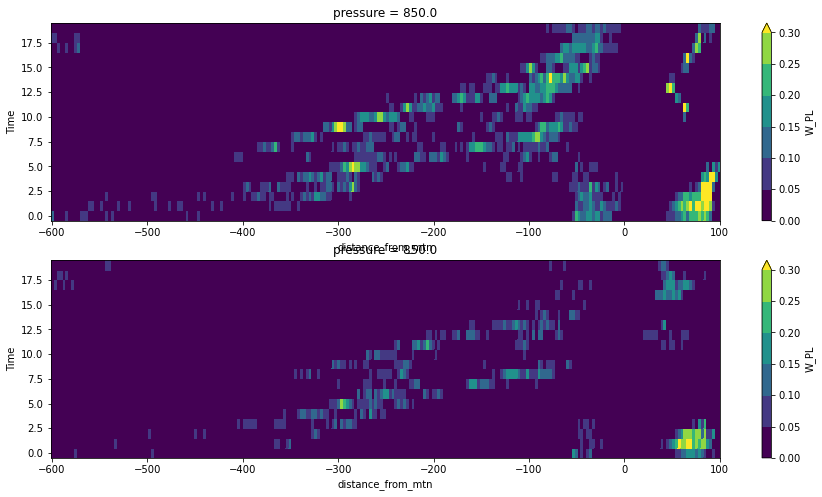

In [29]:
fig,ax = plt.subplots(2,1,figsize=(15,8))
(w_event.sel(pressure=850.)>.5).mean('distance_ns').plot(ax=ax[0],levels=np.arange(0,0.31,0.05))
(w_event.sel(pressure=850.)<-.5).mean('distance_ns').plot(ax=ax[1],levels=np.arange(0,0.31,0.05))

In [185]:
t_upd=(t_event*(w_event.sel(pressure=850.)>.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=850.)>.5).mean(["Time","distance_ns"])
t_dwn=(t_event*(w_event.sel(pressure=850.)<-.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=850.)<-.5).mean(["Time","distance_ns"])
t_env=(t_event*(w_event.sel(pressure=850.)>-.5)*(w_event.sel(pressure=850.)<.5)).mean(["Time","distance_ns"])/((w_event.sel(pressure=850.)>-.5)*(w_event.sel(pressure=850.)<.5)).mean(["Time","distance_ns"])
t_upd=t_upd.persist()
t_dwn=t_dwn.persist()
t_env=t_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [186]:
rh_upd=(rh_event*(w_event.sel(pressure=850.)>.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=850.)>.5).mean(["Time","distance_ns"])
rh_dwn=(rh_event*(w_event.sel(pressure=850.)<-.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=850.)<-.5).mean(["Time","distance_ns"])
rh_env=(rh_event*(w_event.sel(pressure=850.)>-.5)*(w_event.sel(pressure=850.)<.5)).mean(["Time","distance_ns"])/((w_event.sel(pressure=850.)>-.5)*(w_event.sel(pressure=850.)<.5)).mean(["Time","distance_ns"])
rh_upd=rh_upd.persist()
rh_dwn=rh_dwn.persist()
rh_env=rh_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [187]:
w_upd=(w_event*(w_event.sel(pressure=850.)>.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=850.)>.5).mean(["Time","distance_ns"])
w_dwn=(w_event*(w_event.sel(pressure=850.)<-.5)).mean(["Time","distance_ns"])/(w_event.sel(pressure=850.)<-.5).mean(["Time","distance_ns"])
w_env=(w_event*(w_event.sel(pressure=850.)>-.5)*(w_event.sel(pressure=500.)<.5)).mean(["Time","distance_ns"])/((w_event.sel(pressure=850.)>-.5)*(w_event.sel(pressure=850.)<.5)).mean(["Time","distance_ns"])
w_upd=w_upd.persist()
w_dwn=w_dwn.persist()
w_env=w_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Text(0.5, 0.98, 'Temperature')

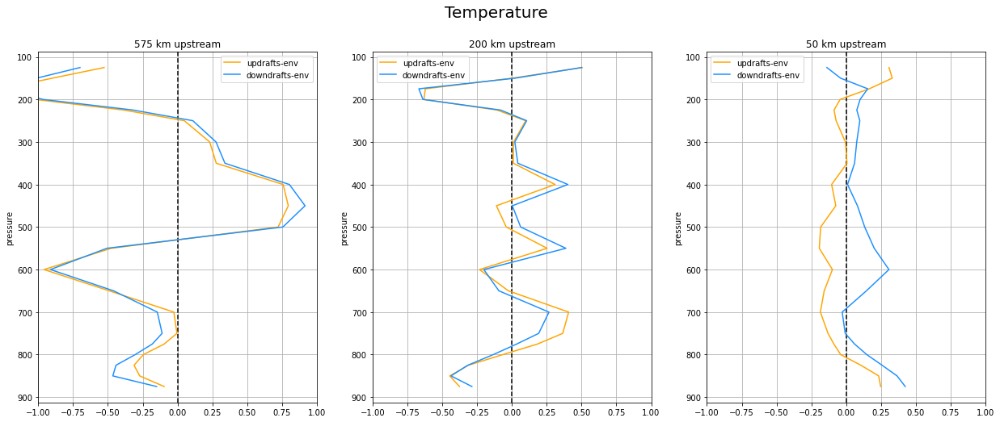

In [188]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (t_upd-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="orange",label="updrafts-env")
    (t_dwn-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="dodgerblue",label="downdrafts-env")
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-1,1)
    ax.grid()
fig.suptitle("Temperature",fontsize=20)


Text(0.5, 0.98, 'Relative humidity')

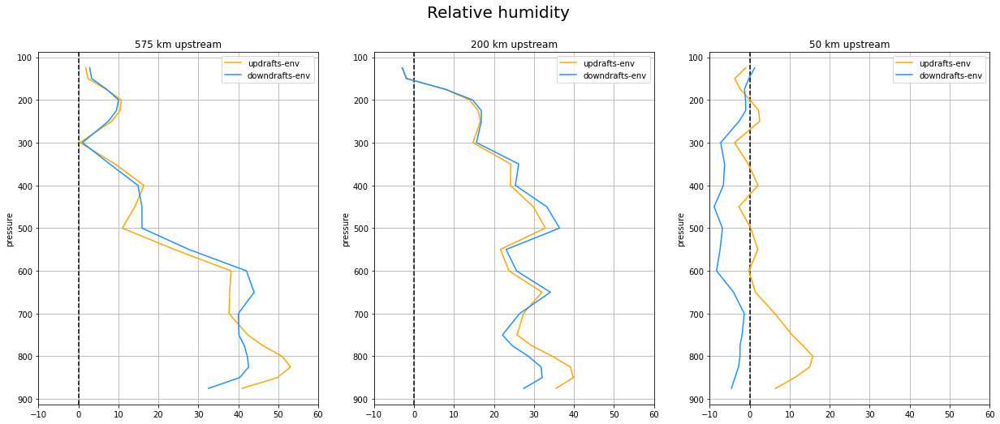

In [189]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (rh_upd-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="orange",label="updrafts-env")
    (rh_dwn-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="dodgerblue",label="downdrafts-env")
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-10,60)
    ax.grid()
fig.suptitle("Relative humidity",fontsize=20)

Text(0.5, 0.98, 'Relative humidity')

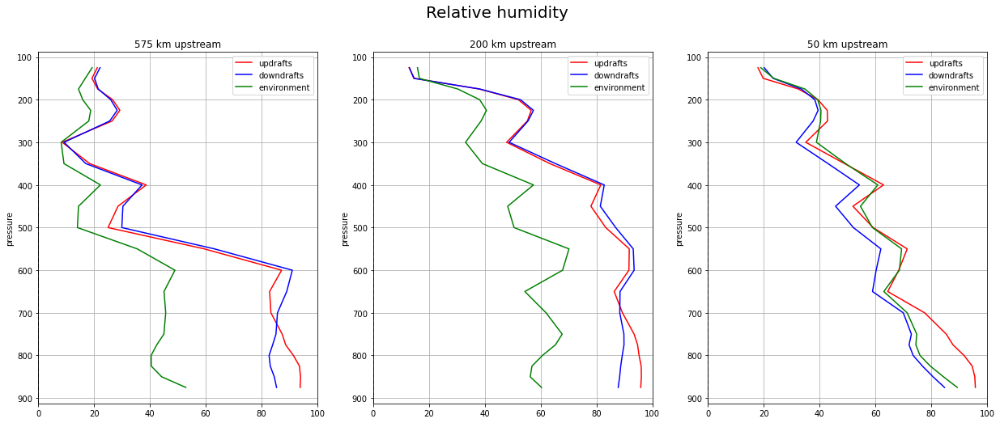

In [190]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    rh_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',label='updrafts')
    rh_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',label='downdrafts')
    rh_env.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',label='environment')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(0,100)
    ax.grid()
fig.suptitle("Relative humidity",fontsize=20)

Text(0.5, 0.98, 'W')

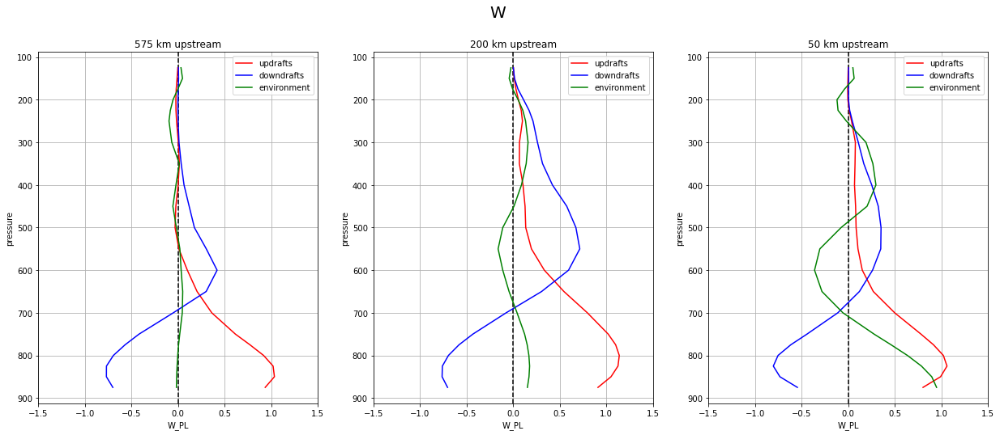

In [191]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    w_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',label='updrafts')
    w_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',label='downdrafts')
    (10*w_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',label='environment')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()    
    ax.set_xlim(-1.5,1.5)
    ax.grid()
fig.suptitle("W",fontsize=20)

## composited level-wise

In [192]:
t_upd=(t_event*(w_event>.5 )).mean(["Time","distance_ns"])/(w_event>.5).mean(["Time","distance_ns"])
t_dwn=(t_event*(w_event<-.5)).mean(["Time","distance_ns"])/(w_event<-.5).mean(["Time","distance_ns"])
t_env=(t_event*(w_event>-.5)*(w_event<.5)).mean(["Time","distance_ns"])/((w_event>-.5)*(w_event<.5)).mean(["Time","distance_ns"])
t_upd=t_upd.persist()
t_dwn=t_dwn.persist()
t_env=t_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [193]:
rh_upd=(rh_event*(w_event>.5 )).mean(["Time","distance_ns"])/(w_event>.5).mean(["Time","distance_ns"])
rh_dwn=(rh_event*(w_event<-.5)).mean(["Time","distance_ns"])/(w_event<-.5).mean(["Time","distance_ns"])
rh_env=(rh_event*(w_event>-.5)*(w_event<.5)).mean(["Time","distance_ns"])/((w_event>-.5)*(w_event<.5)).mean(["Time","distance_ns"])
rh_upd=rh_upd.persist()
rh_dwn=rh_dwn.persist()
rh_env=rh_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [194]:
w_upd=(w_event*(w_event>.5 )).mean(["Time","distance_ns"])/(w_event>.5).mean(["Time","distance_ns"])
w_dwn=(w_event*(w_event<-.5)).mean(["Time","distance_ns"])/(w_event<-.5).mean(["Time","distance_ns"])
w_env=(w_event*(w_event>-.5)*(w_event<.5)).mean(["Time","distance_ns"])/((w_event>-.5)*(w_event<.5)).mean(["Time","distance_ns"])
w_upd=w_upd.persist()
w_dwn=w_dwn.persist()
w_env=w_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-pack

Text(0.5, 0.98, 'Temperature')

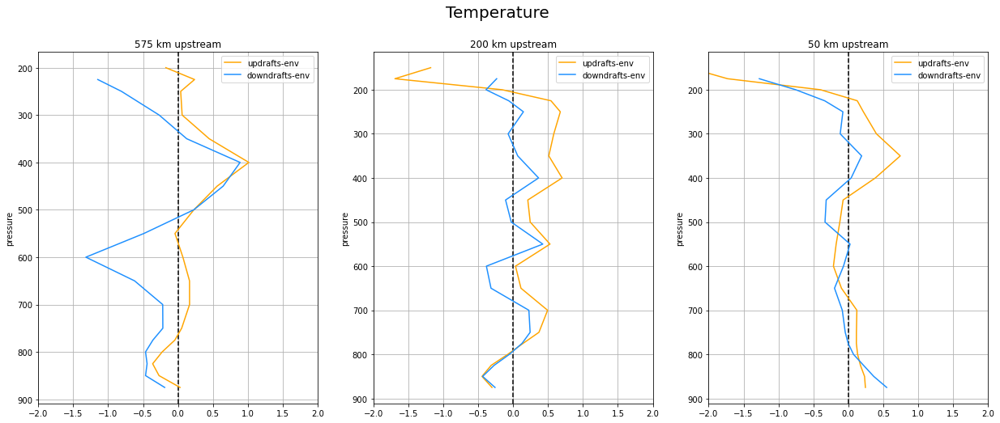

In [195]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (t_upd-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="orange",label="updrafts-env")
    (t_dwn-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="dodgerblue",label="downdrafts-env")
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-2,2)
    ax.grid()
fig.suptitle("Temperature",fontsize=20)


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-pack

Text(0.5, 0.98, 'Relative humidity')

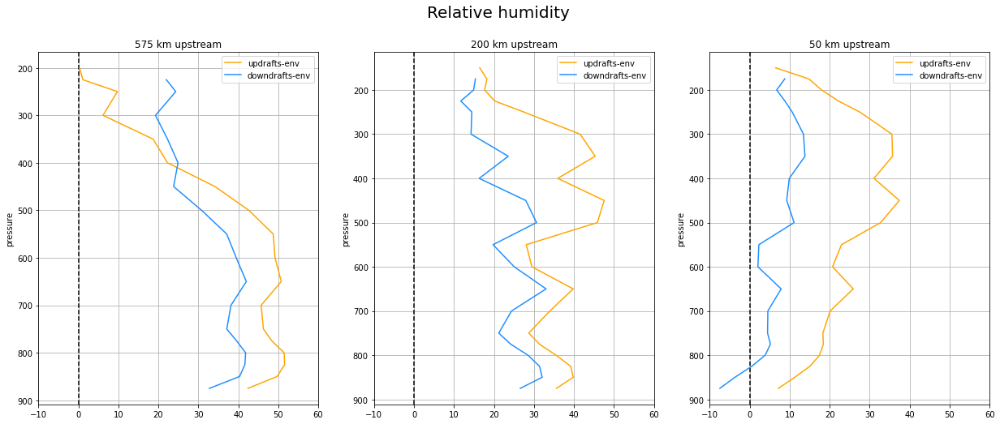

In [196]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (rh_upd-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="orange",label="updrafts-env")
    (rh_dwn-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color="dodgerblue",label="downdrafts-env")
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-10,60)
    ax.grid()
fig.suptitle("Relative humidity",fontsize=20)

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-pack

Text(0.5, 0.98, 'Relative humidity')

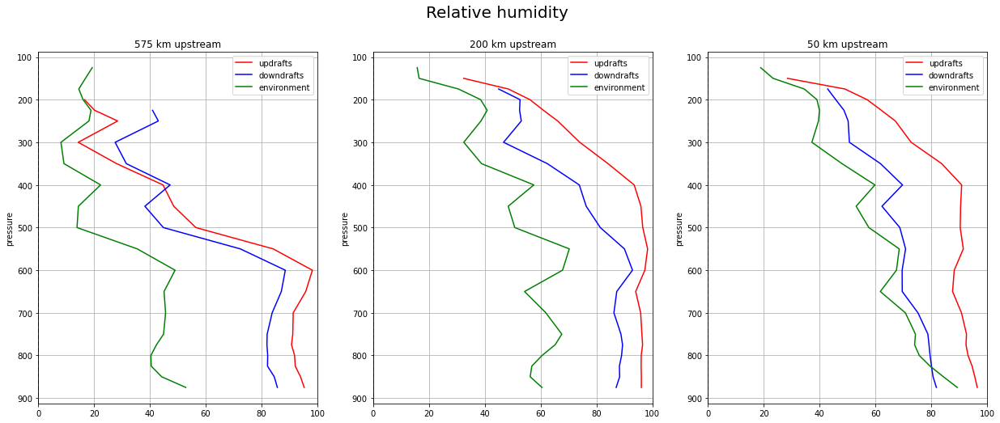

In [197]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    rh_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',label='updrafts')
    rh_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',label='downdrafts')
    rh_env.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',label='environment')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()    
    ax.set_xlim(0,100)
    ax.grid()
fig.suptitle("Relative humidity",fontsize=20)

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-pack

Text(0.5, 0.98, 'W')

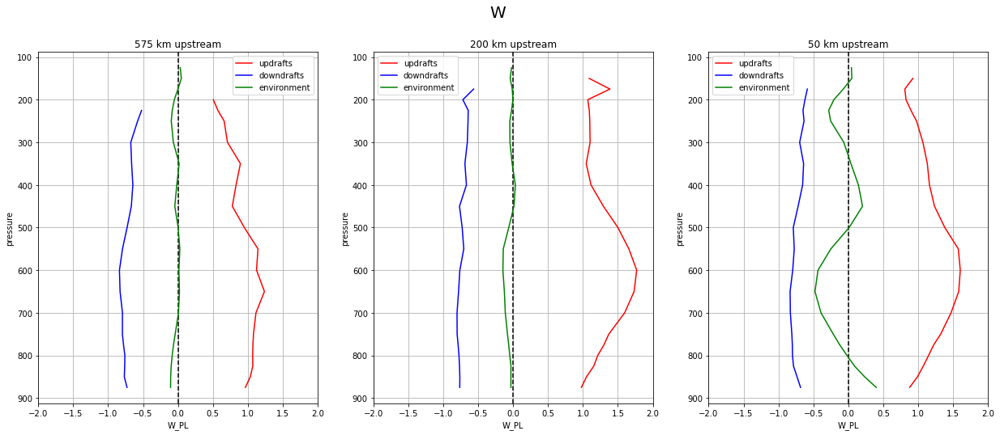

In [198]:
fig,axs = plt.subplots(1,3,figsize=(21,8))
for ax,slc in zip(axs,[(-550,-600),(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    w_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',label='updrafts')
    w_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',label='downdrafts')
    (10*w_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',label='environment')
    ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
    ax.legend()
    ax.set_xlim(-2,2)
    ax.grid()
fig.suptitle("W",fontsize=20)

## composited level-wise, different thresholds

In [199]:
thresh=.5
t_upd=(t_event*(w_event>thresh )).mean(["Time","distance_ns"])/(w_event>thresh).mean(["Time","distance_ns"])
t_env=(t_event*(w_event<thresh)).mean(["Time","distance_ns"])/(w_event<thresh).mean(["Time","distance_ns"])
t_upd=t_upd.persist()
t_env=t_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [200]:
thresh=1.
t_upd2=(t_event*(w_event>thresh )).mean(["Time","distance_ns"])/(w_event>thresh).mean(["Time","distance_ns"])
t_env2=(t_event*(w_event<thresh)).mean(["Time","distance_ns"])/(w_event<thresh).mean(["Time","distance_ns"])
t_upd2=t_upd2.persist()
t_env2=t_env2.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [201]:
thresh=w_event.quantile(0.99,['Time','distance_ns'])
t_upd3=(t_event*(w_event>thresh)).mean(["Time","distance_ns"])/(w_event>thresh).mean(["Time","distance_ns"])
t_env3=(t_event*(w_event<thresh)).mean(["Time","distance_ns"])/(w_event<thresh).mean(["Time","distance_ns"])
t_upd3=t_upd3.persist()
t_env3=t_env3.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


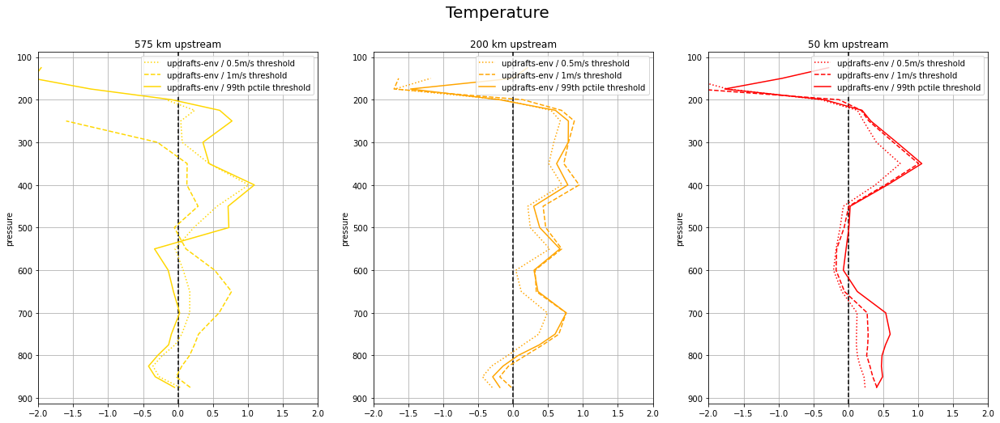

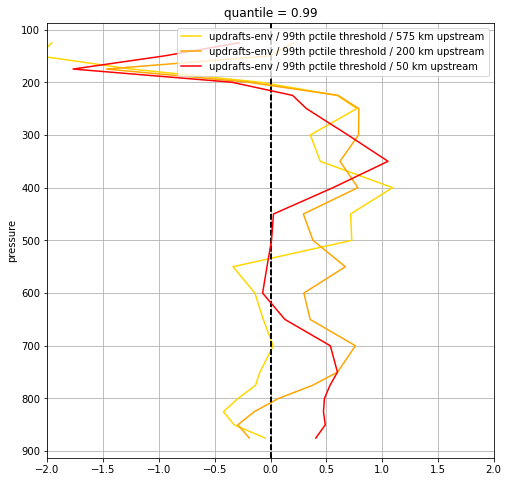

In [202]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig,axs = plt.subplots(1,3,figsize=(21,8))
    for ax,clr,slc in zip(axs,['gold','orange','red'],[(-550,-600),(-175,-225),(-25,-75)]):
        ax.axvline(0.,color='k',linestyle='--')
        (t_upd-t_env  ).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle=':' ,label="updrafts-env / 0.5m/s threshold")
        (t_upd2-t_env2).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle='--',label="updrafts-env / 1m/s threshold")
        (t_upd3-t_env3).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle='-' ,label="updrafts-env / 99th pctile threshold")
            
        ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
        ax.legend()
        ax.set_xlim(-2,2)
        ax.grid()
    fig.suptitle("Temperature",fontsize=20)
    
    fig,ax = plt.subplots(1,1,figsize=(8,8))
    for clr,slc in zip(['gold','orange','red'],[(-550,-600),(-175,-225),(-25,-75)]):
        ax.axvline(0.,color='k',linestyle='--')
        (t_upd3-t_env3).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle='-' ,label="updrafts-env / 99th pctile threshold / %i km upstream"%(-(slc[0]+slc[1])/2))
        ax.legend()
        ax.set_xlim(-2,2)
        ax.grid()


## Shifting reference frame

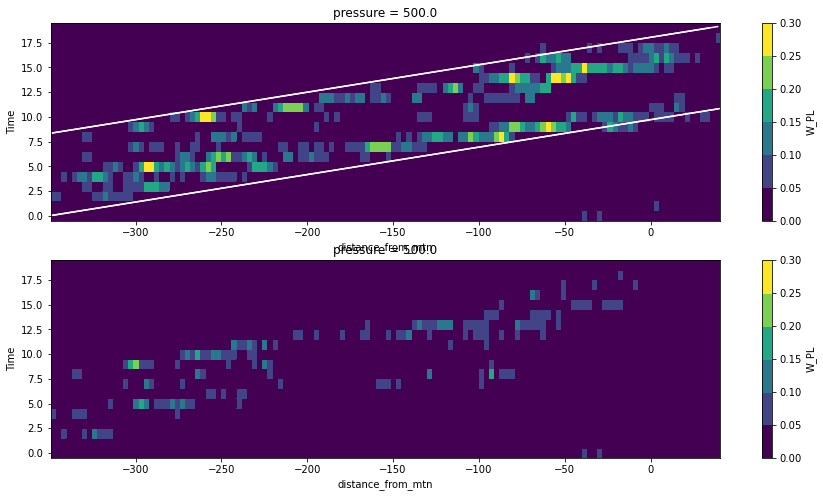

In [76]:
fig,ax = plt.subplots(2,1,figsize=(15,8))
(w_test.sel(pressure=500.)>.5).mean('distance_ns').plot(ax=ax[0],levels=np.arange(0,0.31,0.05))
(w_test.sel(pressure=500.)<-.5).mean('distance_ns').plot(ax=ax[1],levels=np.arange(0,0.31,0.05))

ax[0].plot(w_test.distance_from_mtn,(w_test.distance_from_mtn+650)/(10/1000*3600),color='w')
ax[0].plot(w_test.distance_from_mtn,(w_test.distance_from_mtn+350)/(10/1000*3600),color='w')

ax[0].plot((10/1000*3600)*w_test.Time-650,w_test.Time,color='w')
ax[0].plot((10/1000*3600)*w_test.Time-350,w_test.Time,color='w')

In [203]:
w_test=w_event.sel(distance_from_mtn=slice(40,-350))

In [204]:
w_test=w_test.assign_coords({'Time_shift':w_test.Time-(w_test.distance_from_mtn+350)/(10/1000*3600)})

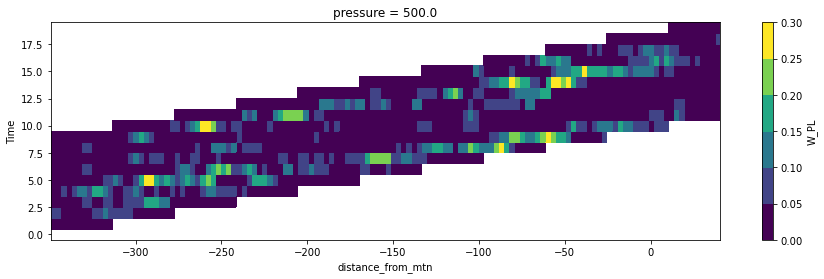

In [205]:
fig,ax = plt.subplots(1,1,figsize=(15,4))
(w_test.sel(pressure=500.)>.5).mean('distance_ns').where(w_test.Time_shift>0).where(w_test.Time_shift<9).plot(ax=ax,levels=np.arange(0,0.31,0.05))


In [206]:
w_test=w_test.where(w_test.Time_shift>0).where(w_test.Time_shift<9)

In [207]:
t_upd=(t_event*(w_test>.5 )).mean(["Time","distance_ns"])/(w_test>.5).mean(["Time","distance_ns"])
t_dwn=(t_event*(w_test<-.5)).mean(["Time","distance_ns"])/(w_test<-.5).mean(["Time","distance_ns"])
t_env=(t_event*(w_test>-.5)*(w_test<.5)).mean(["Time","distance_ns"])/((w_test>-.5)*(w_test<.5)).mean(["Time","distance_ns"])
t_upd=t_upd.persist()
t_dwn=t_dwn.persist()
t_env=t_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [208]:
rh_upd=(rh_event*(w_test>.5 )).mean(["Time","distance_ns"])/(w_test>.5).mean(["Time","distance_ns"])
rh_dwn=(rh_event*(w_test<-.5)).mean(["Time","distance_ns"])/(w_test<-.5).mean(["Time","distance_ns"])
rh_env=(rh_event*(w_test>-.5)*(w_test<.5)).mean(["Time","distance_ns"])/((w_test>-.5)*(w_test<.5)).mean(["Time","distance_ns"])
rh_upd=rh_upd.persist()
rh_dwn=rh_dwn.persist()
rh_env=rh_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [209]:
w_upd=(w_test*(w_test>.5 )).mean(["Time","distance_ns"])/(w_test>.5).mean(["Time","distance_ns"])
w_dwn=(w_test*(w_test<-.5)).mean(["Time","distance_ns"])/(w_test<-.5).mean(["Time","distance_ns"])
w_env=(w_test*(w_test>-.5)*(w_test<.5)).mean(["Time","distance_ns"])/((w_test>-.5)*(w_test<.5)).mean(["Time","distance_ns"])
w_upd=w_upd.persist()
w_dwn=w_dwn.persist()
w_env=w_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-pack

Text(0.5, 1.0, 'RH')

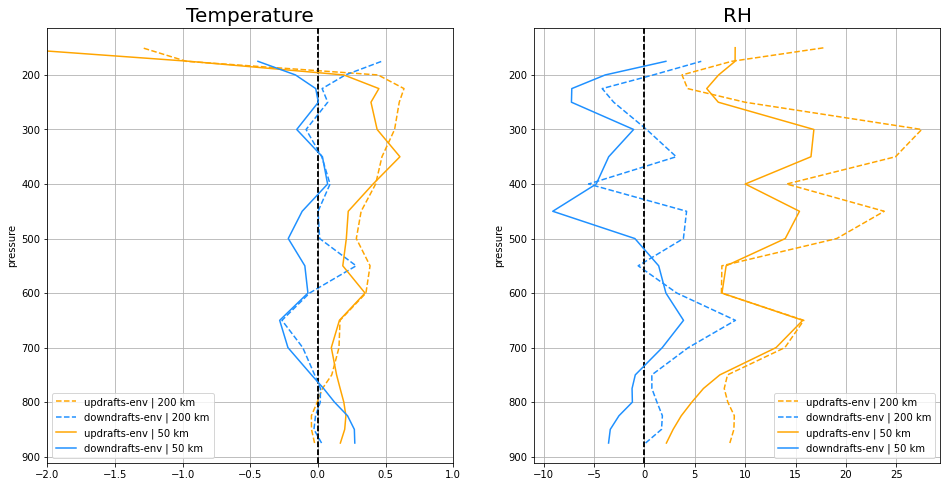

In [210]:
fig,axs = plt.subplots(1,2,figsize=(16,8))
ax=axs[0]
clrs=['orange','dodgerblue']
for lnst,slc in zip(['--','-'],[(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (t_upd-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clrs[0],linestyle=lnst,label="updrafts-env | %i km"%(-(slc[0]+slc[1])/2))
    (t_dwn-t_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clrs[1],linestyle=lnst,label="downdrafts-env | %i km"%(-(slc[0]+slc[1])/2))
ax.set_xlim(-2,1)
ax.grid()
ax.legend()
ax.set_title("Temperature",fontsize=20)

ax=axs[1]
for lnst,slc in zip(['--','-'],[(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    (rh_upd-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clrs[0],linestyle=lnst,label="updrafts-env | %i km"%(-(slc[0]+slc[1])/2))
    (rh_dwn-rh_env).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clrs[1],linestyle=lnst,label="downdrafts-env | %i km"%(-(slc[0]+slc[1])/2))
ax.legend()
ax.grid()
ax.set_title("RH",fontsize=20)



/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-pack

Text(0.5, 1.0, 'RH')

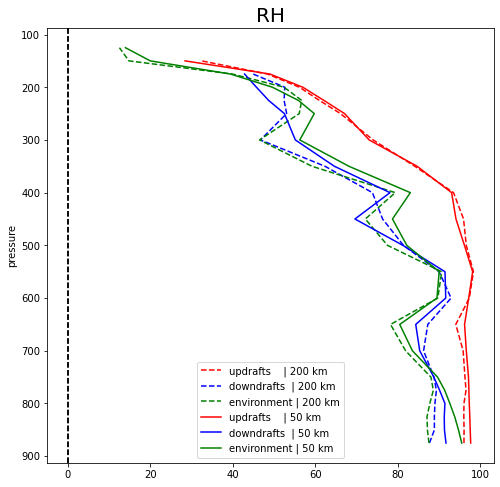

In [111]:
fig,ax = plt.subplots(1,1,figsize=(8,8))
for lnst,slc in zip(['--','-'],[(-175,-225),(-25,-75)]):
    ax.axvline(0.,color='k',linestyle='--')
    rh_upd.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='r',linestyle=lnst,label="updrafts    | %i km"%(-(slc[0]+slc[1])/2))
    rh_dwn.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='b',linestyle=lnst,label="downdrafts  | %i km"%(-(slc[0]+slc[1])/2))
    rh_env.sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color='g',linestyle=lnst,label="environment | %i km"%(-(slc[0]+slc[1])/2))

ax.legend()
ax.set_title("RH",fontsize=20)

### with different thresholds

In [151]:
thresh=.5
t_upd=(t_event*(w_test>thresh )).mean(["Time","distance_ns"])/(w_test>thresh).mean(["Time","distance_ns"])
t_env=(t_event*(w_test<thresh)).mean(["Time","distance_ns"])/(w_test<thresh).mean(["Time","distance_ns"])
t_upd=t_upd.persist()
t_env=t_env.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [152]:
thresh=1.
t_upd2=(t_event*(w_test>thresh )).mean(["Time","distance_ns"])/(w_test>thresh).mean(["Time","distance_ns"])
t_env2=(t_event*(w_test<thresh)).mean(["Time","distance_ns"])/(w_test<thresh).mean(["Time","distance_ns"])
t_upd2=t_upd2.persist()
t_env2=t_env2.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [153]:
thresh=w_test.quantile(0.99,['Time','distance_ns'])
t_upd3=(t_event*(w_test>thresh)).mean(["Time","distance_ns"])/(w_test>thresh).mean(["Time","distance_ns"])
t_env3=(t_event*(w_test<thresh)).mean(["Time","distance_ns"])/(w_test<thresh).mean(["Time","distance_ns"])
t_upd3=t_upd3.persist()
t_env3=t_env3.persist()

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


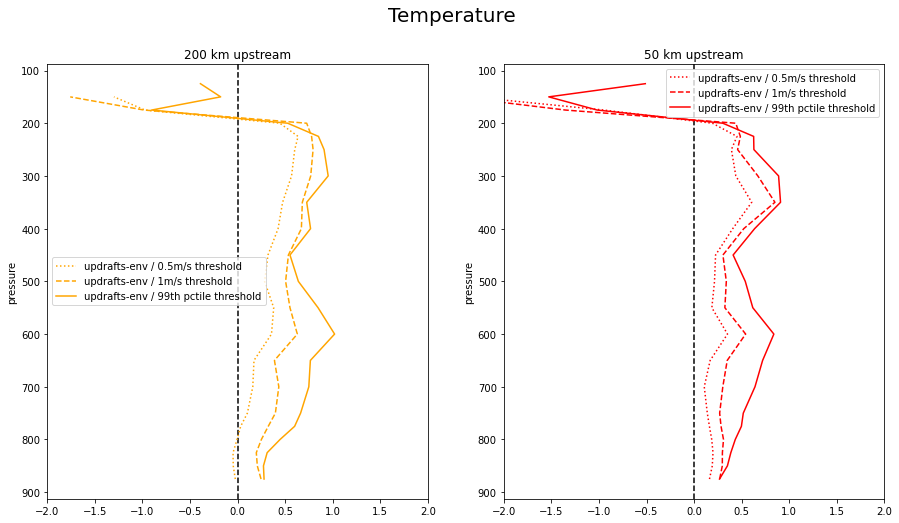

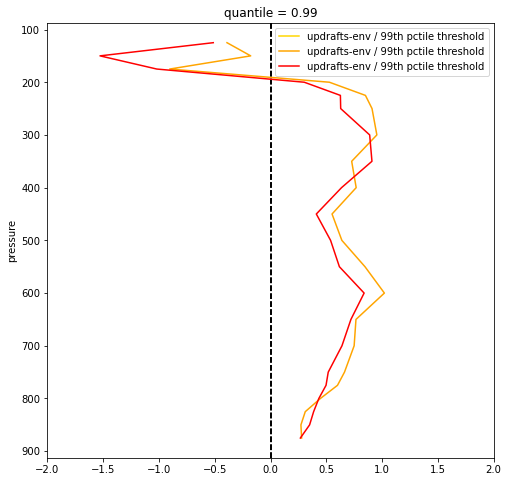

In [154]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig,axs = plt.subplots(1,2,figsize=(15,8))
    for ax,clr,slc in zip(axs,['orange','red'],[(-175,-225),(-25,-75)]):
        ax.axvline(0.,color='k',linestyle='--')
        (t_upd-t_env  ).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle=':' ,label="updrafts-env / 0.5m/s threshold")
        (t_upd2-t_env2).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle='--',label="updrafts-env / 1m/s threshold")
        (t_upd3-t_env3).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle='-' ,label="updrafts-env / 99th pctile threshold")
            
        ax.set_title("%i km upstream"%(-(slc[0]+slc[1])/2))
        ax.legend()
        ax.set_xlim(-2,2)
    fig.suptitle("Temperature",fontsize=20)
    
    fig,ax = plt.subplots(1,1,figsize=(8,8))
    for clr,slc in zip(['gold','orange','red'],[(-550,-600),(-175,-225),(-25,-75)]):
        ax.axvline(0.,color='k',linestyle='--')
        (t_upd3-t_env3).sel(distance_from_mtn=slice(*slc)).mean('distance_from_mtn')[5:-4].plot(ax=ax,y='pressure',yincrease=False,color=clr,linestyle='-' ,label="updrafts-env / 99th pctile threshold")
        ax.legend()
        ax.set_xlim(-2,2)


## Precip vs number of cells

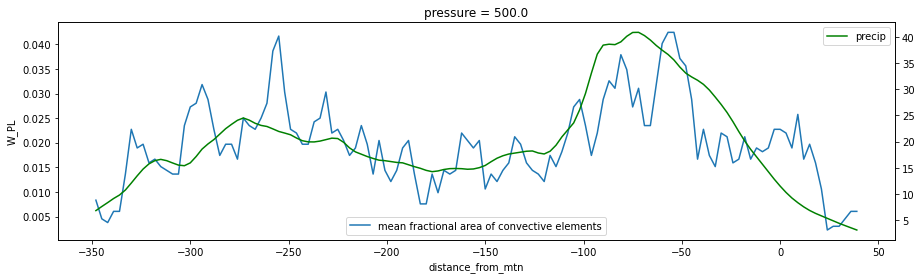

In [166]:
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax2=ax.twinx()
(w_test.sel(pressure=500.)>.5).mean(['distance_ns','Time']).plot(ax=ax,label='mean fractional area of convective elements')
change_coords_sfc(hrchannelprecip_hourly.isel(Time=slice(152*24+10,153*24+6))).sel(distance_from_mtn=slice(40,-350)).mean(['Time','south_north']).plot(ax=ax2,color='g',label='precip')
ax.legend()
ax2.legend()

With a longer event :

In [13]:
#%%time
#w_20days = change_coords_sn(change_coords_pl(hrchannel_p,hrchannel_p.W_PL.isel(Time=slice(150*24,170*24)).squeeze())).sel(distance_from_mtn=slice(100,-1000),pressure=500.).persist()
#w_20days.to_netcdf('/global/cscratch1/sd/qnicolas/temp/w_days150170.nc')

CPU times: user 5.78 s, sys: 1min 30s, total: 1min 36s
Wall time: 2min 9s


In [21]:
%%time
w_20days_850 = change_coords_sn(change_coords_pl(hrchannel_p,hrchannel_p.W_PL.isel(Time=slice(150*24,170*24)).squeeze())).sel(distance_from_mtn=slice(100,-1000),pressure=850.).persist()
w_20days_850.to_netcdf('/global/cscratch1/sd/qnicolas/temp/w_days150170_850hPa.nc')

CPU times: user 1.1 s, sys: 13min 5s, total: 13min 6s
Wall time: 13min 54s


In [17]:
w_20days=xr.open_dataarray('/global/cscratch1/sd/qnicolas/temp/w_days150170.nc')

Text(0.5, 1.0, 'Fractional convective area hovmoeller diagram')

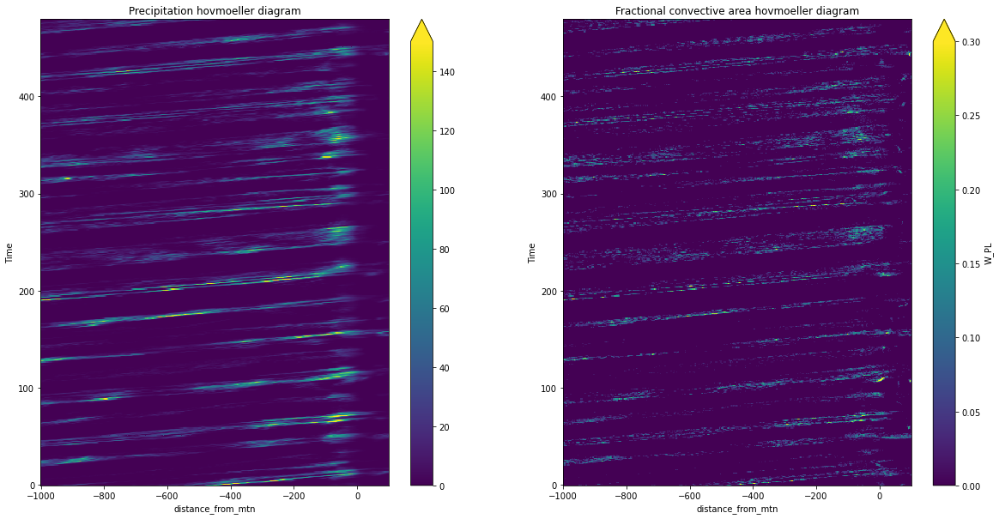

In [23]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
change_coords_sfc(hrchannelprecip_hourly[150*24:170*24]).sel(distance_from_mtn=slice(100,-1000)).mean('south_north').plot(ax=ax[0],vmin=0.,vmax=150)
(w_20days>.5).mean('distance_ns').plot(ax=ax[1],vmin=0.,vmax=0.3)
ax[0].set_title('Precipitation hovmoeller diagram')
ax[1].set_title('Fractional convective area hovmoeller diagram')


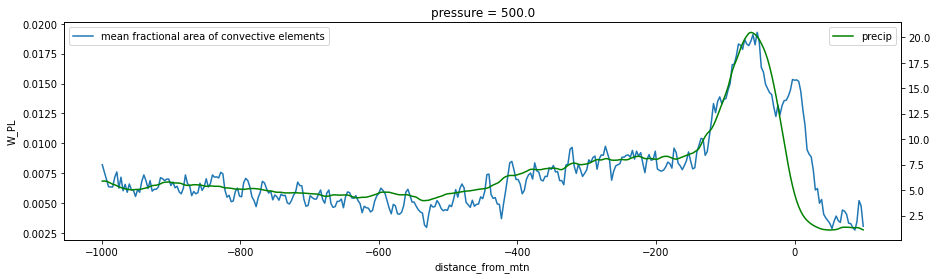

In [18]:
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax2=ax.twinx()
(w_20days>.5).mean(['distance_ns','Time']).plot(ax=ax,label='mean fractional area of convective elements')
change_coords_sfc(hrchannelprecip_hourly[150*24:170*24]).sel(distance_from_mtn=slice(100,-1000)).mean(['Time','south_north']).plot(ax=ax2,color='g',label='precip')
ax.legend()
ax2.legend()

Is it more cells or bigger cells ?

In [33]:
def visit_connected(A,i,j,visited):
    visited[i,j]=1
    i_idxs=(i==0)*[1]+(i==len(A)-1)*[-1]+(i>0)*(i<len(A)-1)*[-1,1]
    j_idxs=(j==0)*[1]+(j==len(A[0])-1)*[-1]+(j>0)*(j<len(A[0])-1)*[-1,1]
    for i1 in i_idxs:
        if A[i+i1,j]>0 and not visited[i+i1,j]:
            visit_connected(A,i+i1,j,visited)
    for j1 in j_idxs:
        if A[i,j+j1]>0 and not visited[i,j+j1]:
            visit_connected(A,i,j+j1,visited)
            
def connected_components(A):
    """Given a matrix A of 0s and 1s, return the number of connected components of 1s (two points are connected if they share a vertex)"""
    visited=np.zeros(A.shape)
    count=0
    for i in range(len(A)):
        for j in range(len(A[0])):
            if A[i,j]>0 and not visited[i,j]:
                count+=1
                visit_connected(A,i,j,visited)
    return count
    

In [50]:
%%time
Nt=480
counts=np.zeros((Nt,11))
for t in range(Nt):
    for i,d in enumerate(range(100,-1000,-100)):
        counts[t,i]=connected_components(np.array((w_20days[t].sel(distance_from_mtn=slice(d,d-100))>.5)*1.))

CPU times: user 15.9 s, sys: 0 ns, total: 15.9 s
Wall time: 15.9 s


In [112]:
%%time
Nt=480
counts50=np.zeros((Nt,22))
for t in range(Nt):
    for i,d in enumerate(range(100,-1000,-50)):
        counts50[t,i]=connected_components(np.array((w_20days[t].sel(distance_from_mtn=slice(d,d-50))>.5)*1.))

CPU times: user 26.1 s, sys: 0 ns, total: 26.1 s
Wall time: 26.1 s


In [68]:
%%time
Nt=480
counts1=np.zeros((Nt,11))
for t in range(Nt):
    for i,d in enumerate(range(100,-1000,-100)):
        counts1[t,i]=connected_components(np.array((w_20days[t].sel(distance_from_mtn=slice(d,d-100))>1.)*1.))

CPU times: user 15 s, sys: 8.85 ms, total: 15 s
Wall time: 15 s


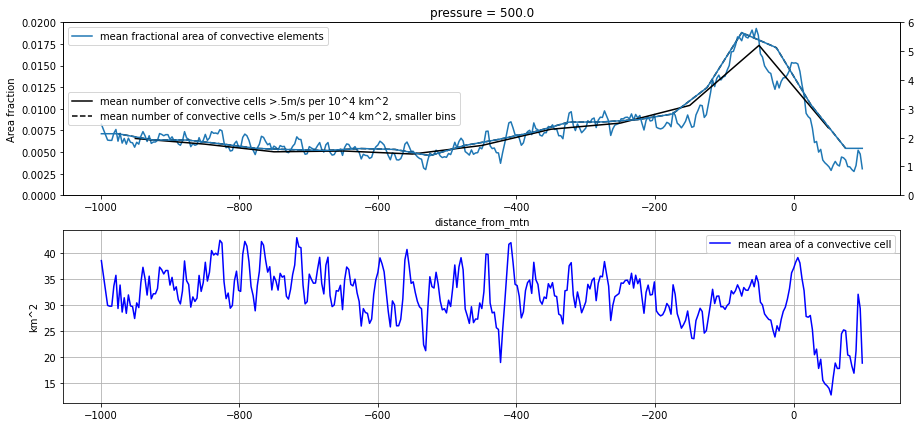

In [116]:
fig,(ax,ax2) = plt.subplots(2,1,figsize=(15,7))
ax1=ax.twinx()

(w_20days>.5).mean(['distance_ns','Time']).plot(ax=ax,label='mean fractional area of convective elements')
ax1.plot(-50+np.arange(100,-1000,-100),counts.mean(axis=0)*100/198,label='mean number of convective cells >.5m/s per 10^4 km^2',color='k')
ax1.plot(-25+np.arange(100,-1000,-50),counts50.mean(axis=0)*100/198*2,label='mean number of convective cells >.5m/s per 10^4 km^2, smaller bins',color='k',linestyle='--')
#counts_interp=np.interp(w_20days.distance_from_mtn[::-1],(-25+np.arange(100,-1000,-50))[::-1],counts50.mean(axis=0)[::-1]*100/198*2)[::-1]
ax1.plot(w_20days.distance_from_mtn,counts_interp)
ax.set_ylabel("Area fraction")
ax.legend()
ax1.legend(loc=6)
ax.set_ylim(0.,0.02)
ax1.set_ylim(0.,6.)

ax2.plot(w_20days.distance_from_mtn,1e4*(w_20days>.5).mean(['distance_ns','Time'])/counts_interp,label='mean area of a convective cell',color='b')
ax2.legend()
ax2.set_ylabel('km^2')
ax2.grid()

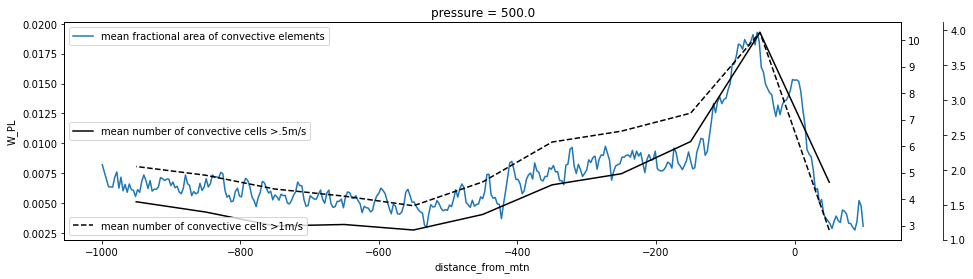

In [75]:
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax2=ax.twinx()
ax3=ax.twinx()
(w_20days>.5).mean(['distance_ns','Time']).plot(ax=ax,label='mean fractional area of convective elements')
ax2.plot(-50+np.arange(100,-1000,-100),counts.mean(axis=0),label='mean number of convective cells >.5m/s',color='k')
ax3.plot(-50+np.arange(100,-1000,-100),counts1.mean(axis=0),label='mean number of convective cells >1m/s',color='k',linestyle='--')

ax.legend()
ax2.legend(loc=6)
ax3.legend(loc=3)
# move the spine of the second axes outwards
ax3.spines["right"].set_position(("axes", 1.05))


In [59]:
#%time rhmean  =hrchannel_p.RH_PL.isel(Time=slice(3600,4801)).mean(['Time','south_north']).persist()
#rhmean.to_netcdf(  '/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.aquaplanet.3km/diags/wrf.RH_PL.days150-200.nc')


CPU times: user 48.7 s, sys: 6min 31s, total: 7min 20s
Wall time: 7min 8s


Text(0.5, 1.0, 'RH - upstream RH')

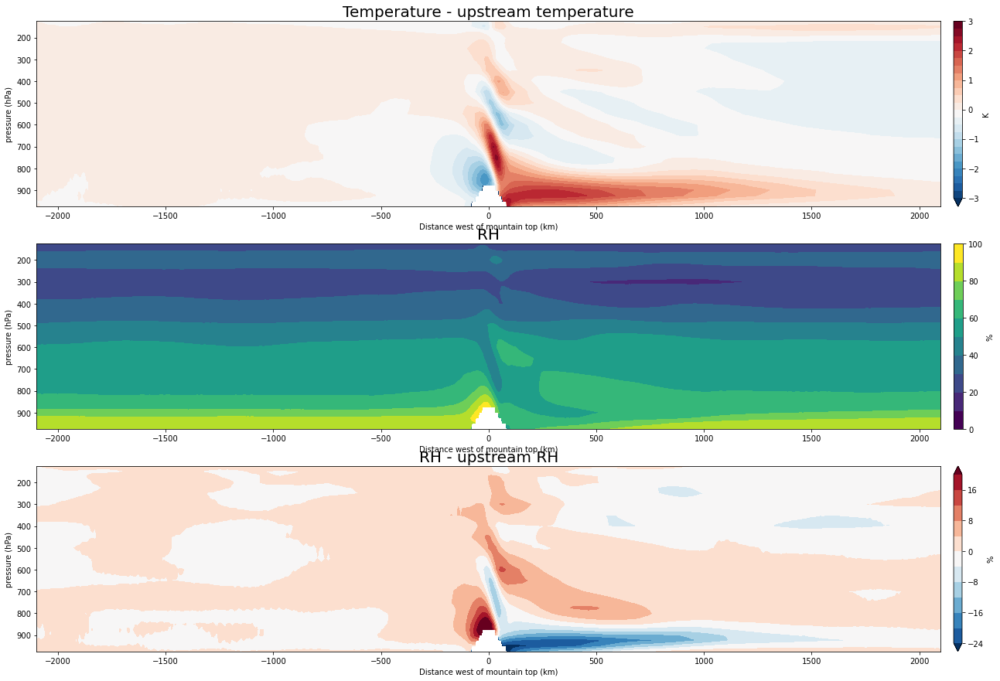

In [32]:
fig,axs=plt.subplots(3,1,figsize=(25,15))

tlevs=np.arange(-3,3.01,0.25)
tticks=np.arange(-3,3.01,1)
(tmean_p-tmean_p[:,2000:3000].mean('distance_from_mtn')).plot.contourf(ax=axs[0],yincrease=False,levels=tlevs,cbar_kwargs={'ticks':tticks,'label':'K','pad':.012})

rhlevs=np.arange(0.,101.,10.)
rhmean_p.plot.contourf(ax=axs[1],yincrease=False,levels=rhlevs,cbar_kwargs={'label':'%','pad':.012})

rhlevs=np.arange(-24.,24.,4.)
(rhmean_p-rhmean_p[:,2000:3000].mean('distance_from_mtn')).plot.contourf(ax=axs[2],yincrease=False,levels=rhlevs,cbar_kwargs={'label':'%','pad':.012})


for ax in axs:
    ax.set_xlabel("Distance west of mountain top (km)")
    ax.set_ylabel("pressure (hPa)")
    ax.set_xlim(-2100,2100)
axs[0].set_title("Temperature - upstream temperature",fontsize=20)
axs[1].set_title("RH"                                ,fontsize=20)
axs[2].set_title("RH - upstream RH"                  ,fontsize=20)

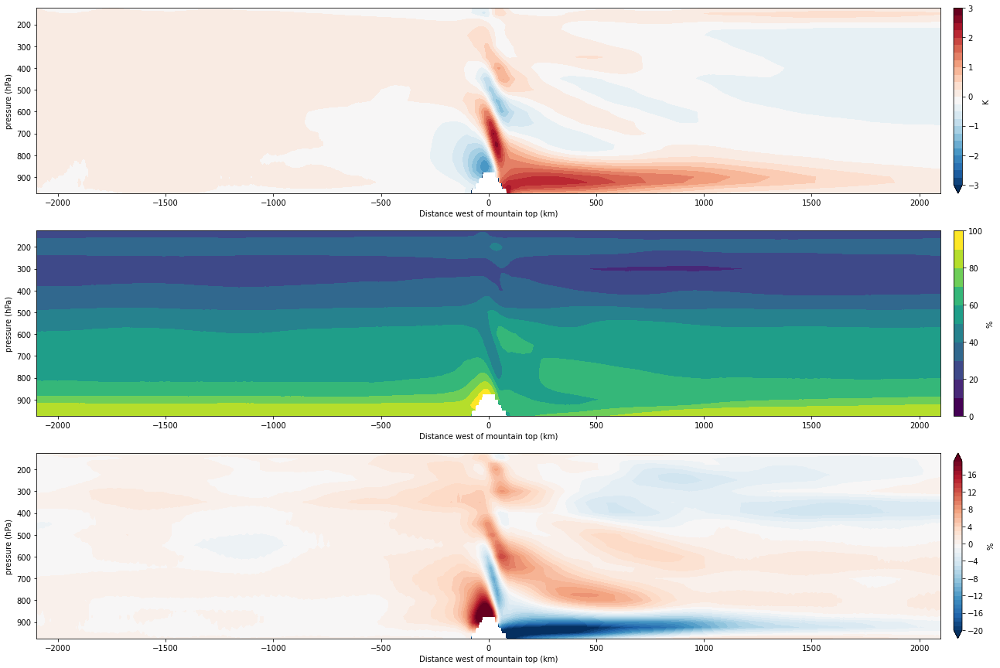

In [67]:
fig,axs=plt.subplots(3,1,figsize=(25,15))

tlevs=np.arange(-3,3.01,0.25)
tticks=np.arange(-3,3.01,1)
(tmean_p-tmean_p[:,2000:3000].mean('distance_from_mtn')).plot.contourf(ax=axs[0],yincrease=False,levels=tlevs,cbar_kwargs={'ticks':tticks,'label':'K','pad':.012})

rhlevs=np.arange(0.,101.,10.)
rhmean_p.plot.contourf(ax=axs[1],yincrease=False,levels=rhlevs,cbar_kwargs={'label':'%','pad':.012})

rhlevs=np.arange(-20.,20.,1.)
(rhmean_p-rhmean_p[:,2000:3000].mean('distance_from_mtn')).plot.contourf(ax=axs[2],yincrease=False,levels=rhlevs,cbar_kwargs={'label':'%','pad':.012})


for ax in axs:
    ax.set_xlabel("Distance west of mountain top (km)")
    ax.set_ylabel("pressure (hPa)")
    ax.set_xlim(-2100,2100)


# Precip vs column relative humidity

## Zonal mean

In [36]:
CRH_s=(qmean_s.integrate('eta_level')/qsat(tmean_s,tmean_s.pressure).integrate('eta_level')).load()

In [38]:
hrpr=hrchannelprecip[200:800].mean(['Time','south_north']).load()

(-2000.0, 2000.0)

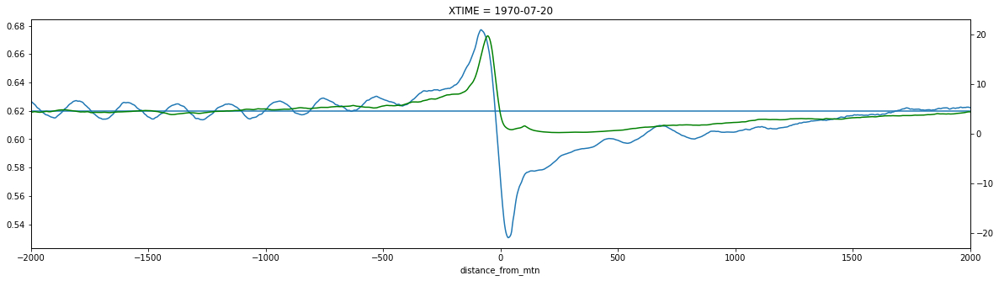

In [49]:
_,ax=plt.subplots(1,1,figsize=(20,5))
ax2=ax.twinx()
CRH_s.plot(ax=ax)
change_coords_sfc(hrpr).plot(ax=ax2,color='g')
ax.axhline(CRH_s[2000:3000].mean())
ax2.set_ylim(-23,23)
plt.xlim(-2000,2000)

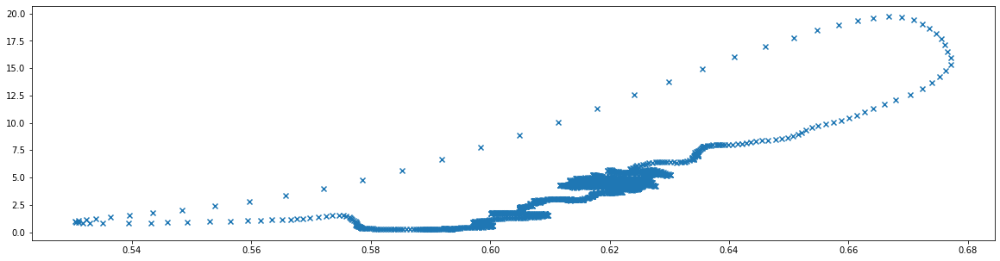

In [39]:
plt.figure(figsize=(20,5))
plt.scatter(CRH_s,hrpr,marker='x')

Text(0, 0.5, 'Precip')

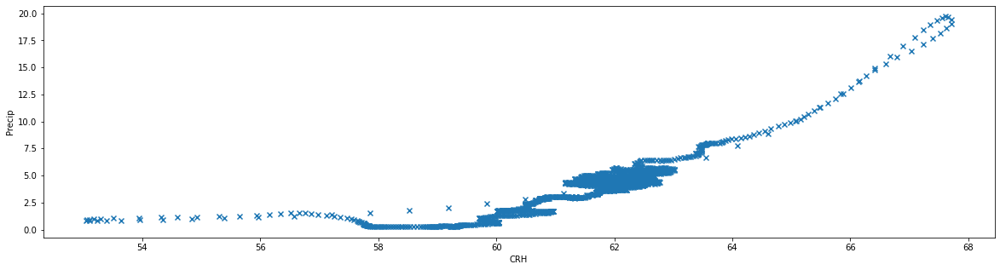

In [39]:
plt.figure(figsize=(20,5))
plt.scatter(np.roll(CRH_s,-7)*100,hrpr,marker='x')
plt.xlabel("CRH")
plt.ylabel("Precip")

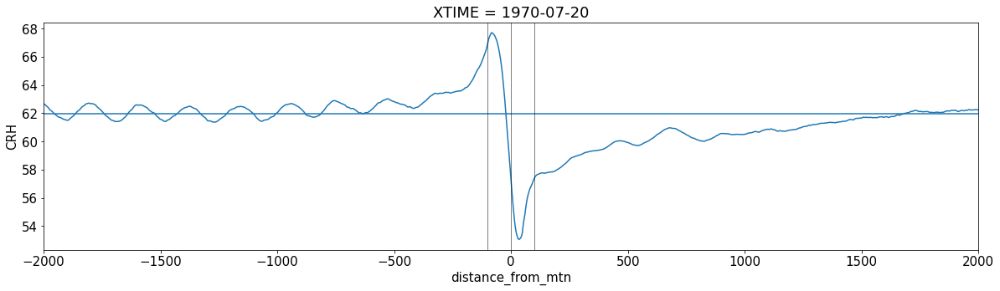

In [48]:
matplotlib.rcParams.update({'font.size':15})
_,ax=plt.subplots(1,1,figsize=(20,5))
(100*CRH_s).plot(ax=ax)
#change_coords_sfc(hrpr).plot(ax=ax2,color='g')
ax.axhline(100*CRH_s[2000:3000].mean())
plt.xlim(-2000,2000)
plt.ylabel("CRH")
plt.axvline(0.   ,linewidth=.5,color='k')
plt.axvline(100. ,linewidth=.5,color='k')
plt.axvline(-100.,linewidth=.5,color='k')

## Binning

In [9]:
#%%time
#hrtemp = (hrchannel.T+300)*((hrchannel.PB+hrchannel.P)/1e5)**0.286
#hrtemp.to_netcdf('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.TEMP.nc')

CPU times: user 6min 8s, sys: 10min 9s, total: 16min 18s
Wall time: 22min 1s


In [12]:
#%time hrchannel.QVAPOR.to_netcdf('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.QVAPOR.nc')

CPU times: user 11.3 s, sys: 5min 8s, total: 5min 19s
Wall time: 20min 45s


In [ ]:
#%time (hrchannel.PB+hrchannel.P).to_netcdf('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.PRESSURE.nc')

In [11]:
hrtemp=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.TEMP.nc')[-100:]
hrtemp_s=hrtemp.assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1),'pressure':hrchannel.PB[-1,:,0,:].load()/100}).swap_dims({'bottom_top':'eta_level'})

hrq=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.QVAPOR.nc')[-100:]
hrq_s=hrq.assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1),'pressure':hrchannel.PB[-1,:,0,:].load()/100}).swap_dims({'bottom_top':'eta_level'})

hrpressure=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.PRESSURE.nc')[-100:]
hrpressure_s=hrpressure.assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1)}).swap_dims({'bottom_top':'eta_level'})

pr=hrchannelprecip[-100:]

In [12]:
hrtemp_mtn=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.TEMP.nc')[200:,:,:,1635:1670]
hrtemp_mtn_s=hrtemp_mtn.assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1)}).swap_dims({'bottom_top':'eta_level'})

hrq_mtn=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.QVAPOR.nc')[200:,:,:,1635:1670]
hrq_mtn_s=hrq_mtn.assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1)}).swap_dims({'bottom_top':'eta_level'})

hrpressure_mtn=xr.open_dataarray('/global/cscratch1/sd/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.3km/diags/wrf.PRESSURE.nc')[200:,:,:,1635:1670]
hrpressure_mtn_s=hrpressure_mtn.assign_coords({'eta_level':hrchannel.ZNU.isel(Time=-1)}).swap_dims({'bottom_top':'eta_level'})

pr_mtn=hrchannelprecip[199:,:,1635:1670]

In [ ]:
#takes 2min
%time hrqsat_s = qsat_WRF(hrtemp_s,hrpressure_s/100)
%time CRH=(hrq_s.integrate('eta_level')/hrqsat_s.integrate('eta_level')).load()
%time hrqsat_mtn_s = qsat_WRF(hrtemp_mtn_s,hrpressure_mtn_s/100)
%time CRH_mtn=(hrq_mtn_s.integrate('eta_level')/hrqsat_mtn_s.integrate('eta_level')).load()

In [11]:
def qsat_WRF(t,p):
    eps=0.622
    s4=611.
    s5=5418.15
    es=s4*np.exp(s5*(1/273-1/t))
    return eps*(es/(p*100-es))
def integrate(da,coordname,dim):
    return xr.apply_ufunc(np.trapz,da,da[coordname],input_core_dims=[[dim],[dim]])
bins_wide=np.arange(0.,100.,2)

In [12]:
%%time
hrtemp_p=change_coords_press(hrchannel_p,hrchannel_p.T_PL[-200:].load())[:,5:-4]
hrq_p   =change_coords_press(hrchannel_p,hrchannel_p.Q_PL[-200:].load())[:,5:-4]
pr_p =hrchannelprecip_hourly[-200:].load()

CPU times: user 7.43 s, sys: 29 s, total: 36.4 s
Wall time: 57.5 s


In [13]:
%time hrqsat_p = qsat_WRF(hrtemp_p,hrtemp_p.pressure)
%time CRH_p=(hrq_p.integrate('pressure')/hrqsat_p.integrate('pressure')).load()

CPU times: user 8.7 s, sys: 19.3 s, total: 28 s
Wall time: 28 s
CPU times: user 4.93 s, sys: 6.32 s, total: 11.2 s
Wall time: 11.2 s


In [11]:
#%time hrqsat_s_tetens = qsat(hrtemp_s,hrpressure_s/100)
#%time CRH_tetens=(hrq_s.integrate('eta_level')/hrqsat_s_tetens.integrate('eta_level')).load()

CPU times: user 42.4 s, sys: 1min 9s, total: 1min 51s
Wall time: 1min 52s


Text(0.5, 1.0, 'Precip vs CRH, hourly, 3km resolution, binned')

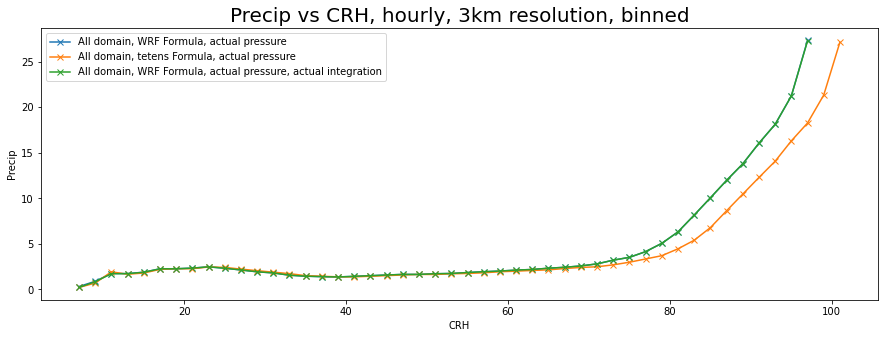

In [16]:
bins_wide=np.arange(0.,100.,2)

plt.figure(figsize=(15,5))

def plot_binned_slice2(crh,slc,lbl,slcpr=None):
    if slcpr is None:
        slcpr=slc
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(100*np.array(crh.sel(west_east=slice(*slc))), bins)
    bin_means = [np.array(pr.sel(west_east=slice(*slcpr)))[digitized == i].mean() for i in range(1, len(bins))]
    plt.plot(bin_centers,bin_means,marker='x',linestyle='-',label=lbl)

plot_binned_slice2(CRH,(0,3271),"All domain, WRF Formula, actual pressure")
plot_binned_slice2(CRH_tetens,(0,3271),"All domain, tetens Formula, actual pressure")
plot_binned_slice2(CRH2,(0,3271),"All domain, WRF Formula, actual pressure, actual integration")


plt.xlabel("CRH")
plt.ylabel("Precip")
plt.legend()
plt.title("Precip vs CRH, hourly, 3km resolution, binned",fontsize=20)

Text(0.5, 1.0, 'Precip vs CRH, hourly, 3km/1h resolution, binned')

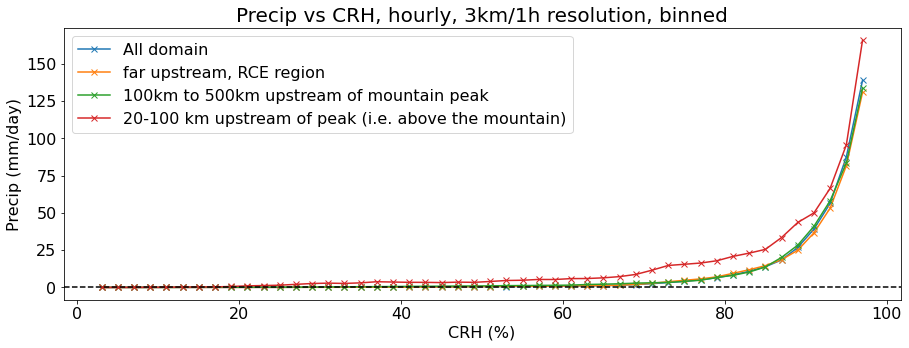

In [43]:
bins_wide=np.arange(0.,120.,2)
matplotlib.rcParams.update({'font.size':16})
plt.figure(figsize=(15,5))

def plot_binned_slice(crh,pr,slc,lbl,slcpr=None,shift=0):
    if slcpr is None:
        slcpr=slc
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(100*np.array(crh.sel(west_east=slice(*slc))), bins)
    bin_means = [np.array(pr.sel(west_east=slice(*slcpr)))[digitized == i].mean()-shift for i in range(1, len(bins))]
    plt.plot(bin_centers,bin_means,marker='x',linestyle='-',label=lbl)

plot_binned_slice(CRH_p[:-1],pr_p[1:],(0,3271),'All domain')
plot_binned_slice(CRH_p[:-1],pr_p[1:],(1635+2000//3,3270),'far upstream, RCE region')
plot_binned_slice(CRH_p[:-1],pr_p[1:],(1670,1800),'100km to 500km upstream of mountain peak')
plot_binned_slice(CRH_p[:-1],pr_p[1:],(1642,1670),'20-100 km upstream of peak (i.e. above the mountain)',None)
#plot_binned_slice(CRH_mtn[:-1],pr_mtn[1:],(7,35),'mtn, 6h',None)

plt.axhline(0.,color='k',linestyle='--')

plt.xlabel("CRH (%)")
plt.ylabel("Precip (mm/day)")
plt.legend()
plt.title("Precip vs CRH, hourly, 3km/1h resolution, binned",fontsize=20)
#plt.ylim(-10,100)

(-10.0, 20.0)

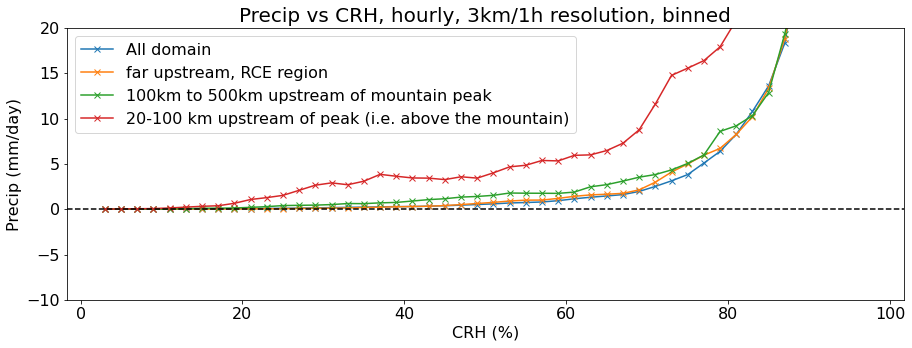

In [145]:
bins_wide=np.arange(0.,120.,2)
matplotlib.rcParams.update({'font.size':16})
plt.figure(figsize=(15,5))

plot_binned_slice(CRH_p[:-1],pr_p[1:],(0,3271),'All domain')
plot_binned_slice(CRH_p[:-1],pr_p[1:],(1635+2000//3,3270),'far upstream, RCE region')
plot_binned_slice(CRH_p[:-1],pr_p[1:],(1670,1800),'100km to 500km upstream of mountain peak')
plot_binned_slice(CRH_p[:-1],pr_p[1:],(1642,1670),'20-100 km upstream of peak (i.e. above the mountain)',None)
#plot_binned_slice(CRH_mtn[:-1],pr_mtn[1:],(7,35),'mtn, 6h',None)

plt.axhline(0.,color='k',linestyle='--')

plt.xlabel("CRH (%)")
plt.ylabel("Precip (mm/day)")
plt.legend()
plt.title("Precip vs CRH, hourly, 3km/1h resolution, binned",fontsize=20)
plt.ylim(-10,20)

Text(0.5, 1.0, 'CRH density, hourly, 3km resolution')

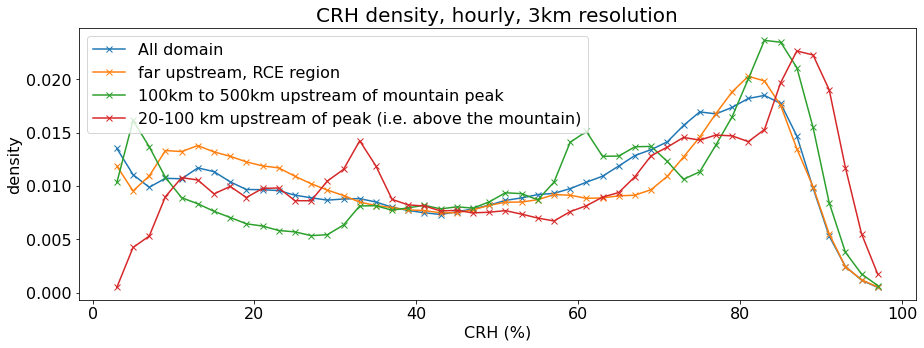

In [144]:
bins_wide=np.arange(0.,120.,2)

plt.figure(figsize=(15,5))

def plot_density_slice(crh,slc,lbl):
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    crhdensity = np.histogram(100*crh.sel(west_east=slice(*slc)),bins,density=True)[0]
    plt.plot(bin_centers,crhdensity,marker='x',linestyle='-',label=lbl)
    
plot_density_slice(CRH_p,(0,3271),'All domain')
plot_density_slice(CRH_p,(1635+2000//3,3270),'far upstream, RCE region')
plot_density_slice(CRH_p,(1670,1800),'100km to 500km upstream of mountain peak')
plot_density_slice(CRH_mtn_p,(7,35),'20-100 km upstream of peak (i.e. above the mountain)')


plt.xlabel("CRH (%)")
plt.ylabel("density")
plt.legend()

plt.title("CRH density, hourly, 3km resolution",fontsize=20)

(-10.0, 70.0)

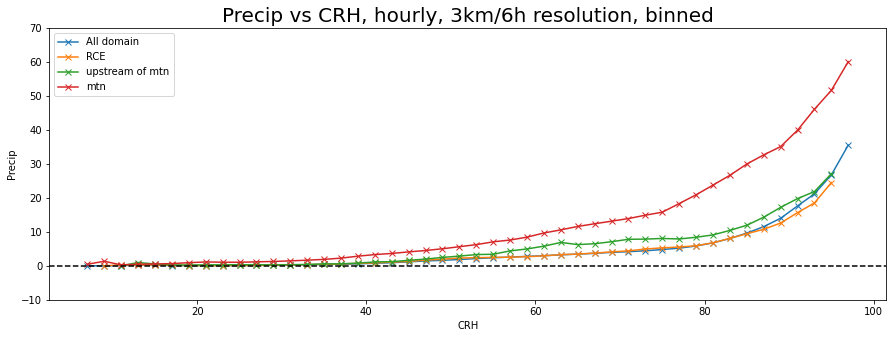

In [134]:
bins_wide=np.arange(0.,120.,2)

plt.figure(figsize=(15,5))

def plot_binned_slice(crh,pr,slc,lbl,slcpr=None,shift=0):
    if slcpr is None:
        slcpr=slc
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(100*np.array(crh.sel(west_east=slice(*slc))), bins)
    bin_means = [np.array(pr.sel(west_east=slice(*slcpr)))[digitized == i].mean()-shift for i in range(1, len(bins))]
    plt.plot(bin_centers,bin_means,marker='x',linestyle='-',label=lbl)

plot_binned_slice(CRH[:-1],pr[1:],(0,3271),'All domain')
plot_binned_slice(CRH[:-1],pr[1:],(1635+2000//3,3270),'RCE')
plot_binned_slice(CRH[:-1],pr[1:],(1670,1800),'upstream of mtn')
plot_binned_slice(CRH_mtn[:-1],pr_mtn[1:],(7,35),'mtn',None)

plt.axhline(0.,color='k',linestyle='--')

plt.xlabel("CRH")
plt.ylabel("Precip")
plt.legend()
plt.title("Precip vs CRH, hourly, 3km/6h resolution, binned",fontsize=20)
plt.ylim(-10,70)

Text(0.5, 1.0, 'CRH density, hourly, 3km resolution')

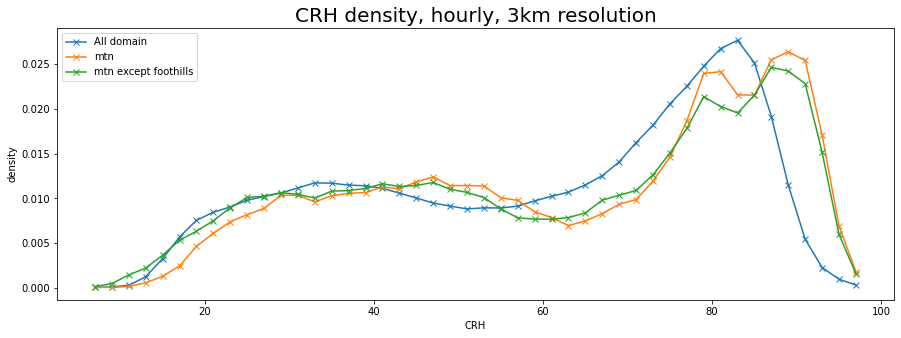

In [40]:
bins_wide=np.arange(0.,120.,2)

plt.figure(figsize=(15,5))

def plot_density_slice(slc,lbl):
    bins=bins_wide[(bins_wide>float(100*CRH.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*CRH.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    crhdensity = np.histogram(100*CRH.sel(west_east=slice(*slc)),bins,density=True)[0]
    plt.plot(bin_centers,crhdensity,marker='x',linestyle='-',label=lbl)
    
plot_density_slice((0,3271),'All domain')
#plot_density_slice((1635+2000//3,3270),'RCE')
#plot_density_slice((1670,1800),'upstream of mtn')
plot_density_slice((1642,1670),'mtn')
plot_density_slice((1635,1663),'mtn except foothills')

plt.xlabel("CRH")
plt.ylabel("density")
plt.legend()

plt.title("CRH density, hourly, 3km resolution",fontsize=20)

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice.
  import sys
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice.
  app.launch_new_instance()
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


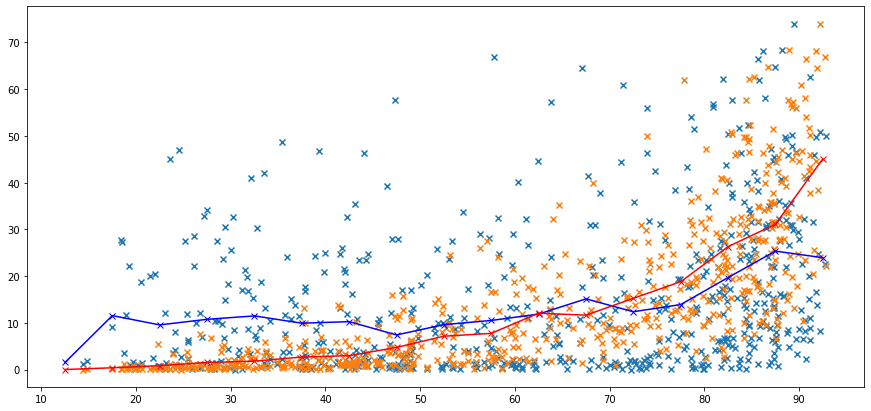

In [113]:
plt.figure(figsize=(15,7))
bins=np.arange(5,96,5)
CRH_mtn_xymean = CRH_mtn.isel(west_east=slice(0,28)).mean(['south_north','west_east'])
pr_mtn_xymean = pr_mtn.isel(west_east=slice(0,28)).mean(['south_north','west_east'])
bin_centers=(bins[1:]+bins[:-1])/2
digitized = np.digitize(100*np.array(CRH_mtn_xymean), bins)
bin_means = [np.array(pr_mtn_xymean)[digitized == i].mean() for i in range(1, len(bins))]
plt.plot(bin_centers,bin_means,marker='x',linestyle='-',color='b')

plt.scatter(100*CRH_mtn_xymean,pr_mtn_xymean,marker='x')

CRH_mtn_xymean = CRH_mtn.isel(west_east=slice(0,28)).mean(['south_north','west_east'])[:-1]
pr_mtn_xymean = pr_mtn.isel(west_east=slice(0,28)).mean(['south_north','west_east'])[1:]
bin_centers=(bins[1:]+bins[:-1])/2
digitized = np.digitize(100*np.array(CRH_mtn_xymean), bins)
bin_means = [np.array(pr_mtn_xymean)[digitized == i].mean() for i in range(1, len(bins))]
plt.plot(bin_centers,bin_means,marker='x',linestyle='-',color='r')

plt.scatter(100*CRH_mtn_xymean,pr_mtn_xymean,marker='x')

## Theory

In [63]:
bins_wide=np.arange(0.,101.,.5)
def bins_slice(crh,pr,slc,lbl,slcpr=None,shift=0):
    if slcpr is None:
        slcpr=slc
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(100*np.array(crh.sel(west_east=slice(*slc))), bins)
    bin_means = [np.array(pr.sel(west_east=slice(*slcpr)))[digitized == i].mean()-shift for i in range(1, len(bins))]
    return bin_centers,bin_means
bin_centers,bin_means = bins_slice(CRH_p[:-1],pr_p[1:],(0,3271),'All domain')


Text(0.5, 1.0, 'Precip vs CRH, hourly, 3km/1h resolution, binned')

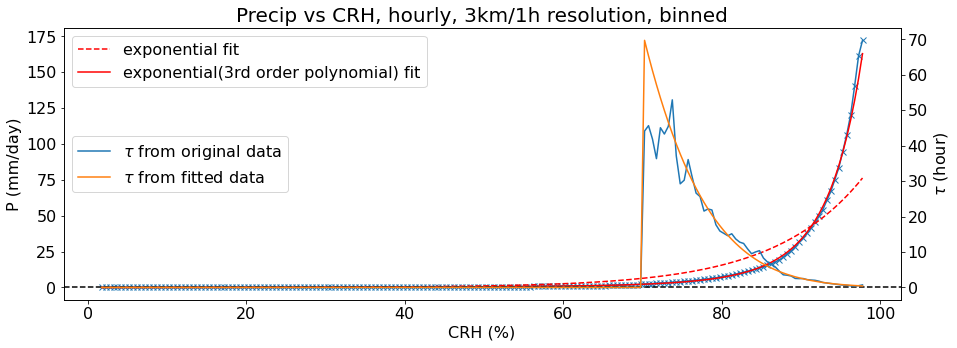

In [64]:
bins_wide=np.arange(0.,101.,.2)
matplotlib.rcParams.update({'font.size':16})
_,ax=plt.subplots(1,1,figsize=(15,5))
ax2=ax.twinx()


k1=120
k2=1

A = np.vstack([bin_centers, np.ones(len(bin_centers))]).T
m, c = np.linalg.lstsq(A, np.log(bin_means), rcond=None)[0]
rc = -c/m
from scipy.optimize import minimize
mrc = minimize(lambda mr : np.sum(bin_means[k1:-k2]-np.exp(mr[0]*(bin_centers[k1:-k2]-mr[1])))**2,x0=np.array([m,rc]))
m,rc=mrc.x

ax.plot(bin_centers,bin_means,marker='x',linestyle='-')
ax.plot(bin_centers,np.exp(m*(bin_centers-rc)),color='r',linestyle='--',label='exponential fit')
p=np.poly1d(np.polyfit(bin_centers, np.log(bin_means), 3))
ax.plot(bin_centers,np.exp(p(bin_centers)),color='r',label='exponential(3rd order polynomial) fit')

Wstar = -qsat_WRF(tmean_p[:,2000],tmean_p[:,2000].pressure).integrate('pressure')*100/9.81
taus = (bin_centers>70)*np.array(Wstar)/(np.gradient(bin_means,bin_centers/100))*24
taus_poly = (bin_centers>70)*np.array(Wstar)/(100*np.polyder(p)(bin_centers)*np.exp(p(bin_centers)))*24

ax2.plot(bin_centers,taus,label=r"$\tau$ from original data")
ax2.plot(bin_centers,taus_poly,label=r'$\tau$ from fitted data')

ax.axhline(0.,color='k',linestyle='--')

ax.set_xlabel("CRH (%)")
ax.set_ylabel("P (mm/day)")
ax2.set_ylabel(r"$\tau$ (hour)")
ax.legend()
ax2.legend(loc=6)
ax.set_title("Precip vs CRH, hourly, 3km/1h resolution, binned",fontsize=20)
#plt.xscale('log')
#plt.yscale('log')
#plt.ylim(-10,100)

Text(0.5, 1.0, 'CRH density, hourly, 3km resolution')

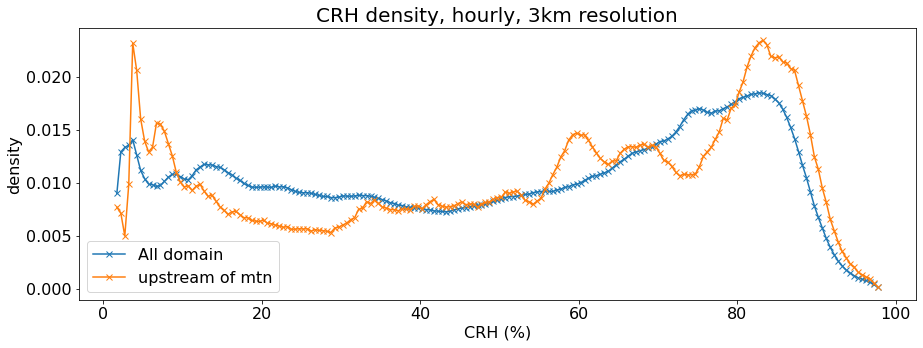

In [23]:
bins_wide=np.arange(0.,101.,.5)

plt.figure(figsize=(15,5))

def plot_density_slice(crh,slc,lbl):
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    crhdensity = np.histogram(100*crh.sel(west_east=slice(*slc)),bins,density=True)[0]
    plt.plot(bin_centers,crhdensity,marker='x',linestyle='-',label=lbl)
    
plot_density_slice(CRH_p,(0,3271),'All domain')
plot_density_slice(CRH_p,(1635+33,1635+200),'upstream of mtn')

plt.xlabel("CRH (%)")
plt.ylabel("density")
plt.legend()

plt.title("CRH density, hourly, 3km resolution",fontsize=20)

In [ ]:
pcrh

In [78]:
bins_wide=np.arange(0.,101.,.5)

def density_slice(crh,slc):
    bins=bins_wide[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    crhdensity = np.histogram(100*crh.sel(west_east=slice(*slc)),bins,density=True)[0]
    return bin_centers,crhdensity

bin_centers,crhdensity = density_slice(CRH_p,(0,3271))
pcrh=np.poly1d(np.polyfit(bin_centers, crhdensity, 25))
pcrh_cap = lambda r : np.maximum(0.,pcrh(r))

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3418: RankWarning: Polyfit may be poorly conditioned
  exec(code_obj, self.user_global_ns, self.user_ns)


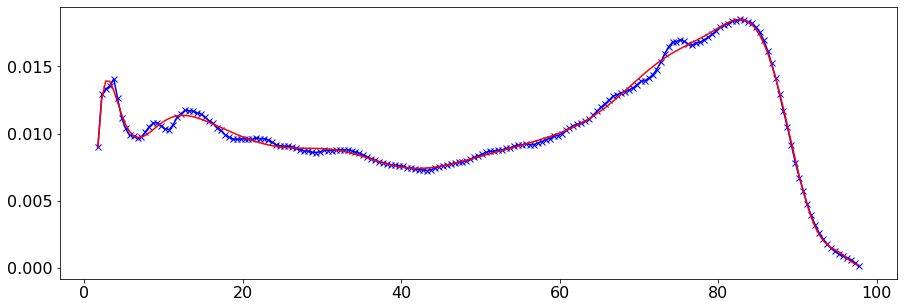

In [63]:
_,ax=plt.subplots(1,1,figsize=(15,5))
ax.plot(bin_centers,crhdensity,color='b',marker='x',label='CRH density')
ax.plot(bin_centers,pcrh(bin_centers),color='r',label='fit')

In [48]:
full_eta=hrchannel.ZNW.isel(Time=-1)
eta=hrchannel.ZNU.isel(Time=-1).load()
deta=xr.DataArray(-np.diff(full_eta),coords={'eta_level':np.array(eta)},dims=['eta_level']).load()
dpdeta = xr.DataArray(np.gradient(hrchannel.PB[-1,:,0,:],hrchannel.ZNU.isel(Time=-1),axis=0, edge_order=2),coords={'eta_level':np.array(eta),'distance_from_mtn':tmean_s.distance_from_mtn},dims=['eta_level','distance_from_mtn'])

In [49]:
qmean_integ = (qmean_s*deta*dpdeta).sum('eta_level')

In [93]:
qsatmean_integ = (qsat_WRF(tmean_s,tmean_s.pressure)*deta*dpdeta).sum('eta_level')
lbd=qsatmean_integ[2300]/qsatmean_integ

qsatmean_integ = (qsat_WRF(tmean_s,tmean_s.pressure)*deta*dpdeta)[:15].sum('eta_level')
lbd2=qsatmean_integ[2300]/qsatmean_integ

Text(0.5, 1.0, 'Water vapor paths')

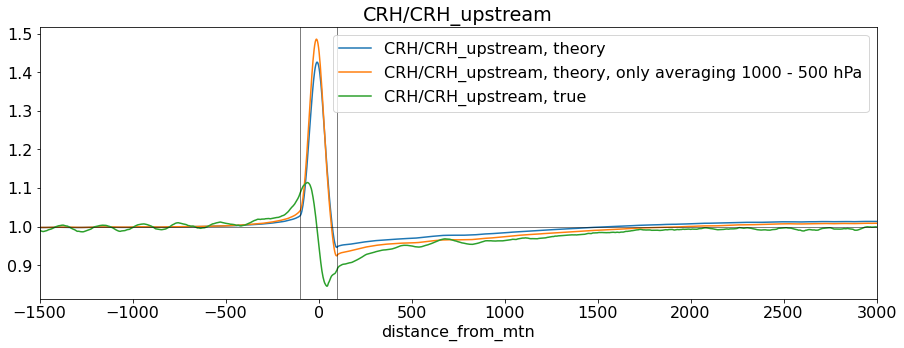

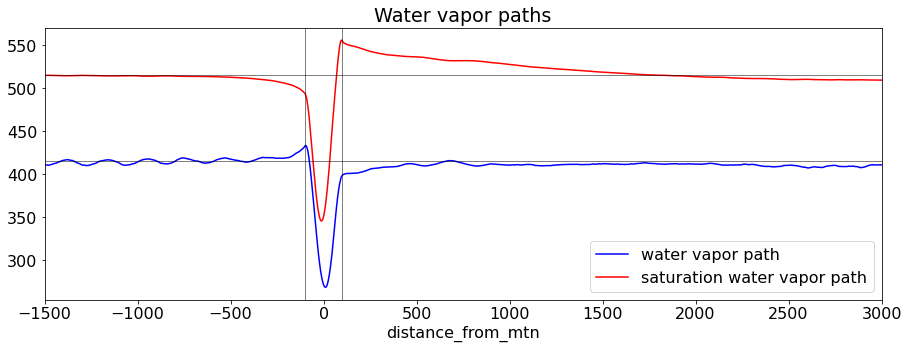

In [104]:
plt.figure(figsize=(15,5))
crh_true=(qmean_integ/qsatmean_integ)
lbd.plot(label="CRH/CRH_upstream, theory")
lbd2.plot(label="CRH/CRH_upstream, theory, only averaging 1000 - 500 hPa")
(crh_true/crh_true[2250]).plot(label="CRH/CRH_upstream, true")
plt.axhline(1.,color='k',linewidth=0.5)
plt.xlim(-1500,3000)
plt.axvline(-100,color='k',linewidth=0.5)
plt.axvline(100,color='k',linewidth=0.5)
plt.legend()
plt.title('CRH/CRH_upstream')

plt.figure(figsize=(15,5))
qmean_integ.plot(color='b',label="water vapor path")
qsatmean_integ.plot(color='r',label="saturation water vapor path")
plt.xlim(-1500,3000)
plt.axvline(-100,color='k',linewidth=0.5)
plt.axvline(100,color='k',linewidth=0.5)
plt.axhline(515,color='k',linewidth=0.5)
plt.axhline(415,color='k',linewidth=0.5)
plt.legend()
plt.title('Water vapor paths')

In [82]:
rs = xr.DataArray(bin_centers,coords={'r':bin_centers},dims=['r'])
crhs = xr.apply_ufunc(pcrh_cap,rs/lbd)/lbd
crhs2 = xr.apply_ufunc(pcrh_cap,rs/lbd2)/lbd2

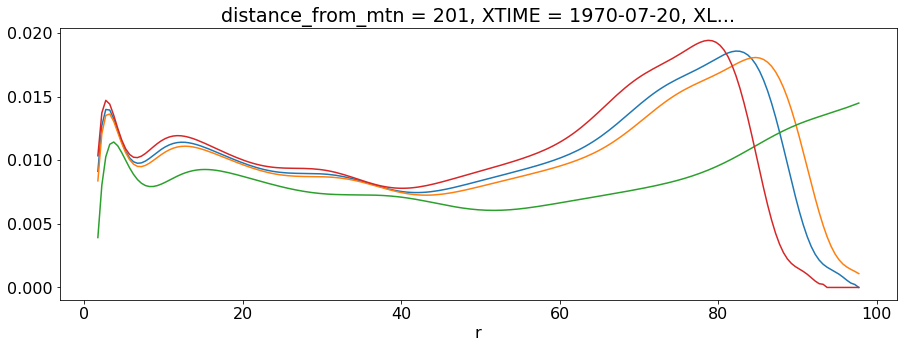

In [65]:
plt.figure(figsize=(15,5))
crhs.sel(distance_from_mtn=-2000,method='nearest').plot()
crhs.sel(distance_from_mtn=-100,method='nearest').plot()
crhs.sel(distance_from_mtn=-50,method='nearest').plot()
crhs.sel(distance_from_mtn=200,method='nearest').plot()

In [106]:
hrpr=change_coords_sfc(hrchannelprecip[200:].mean(['Time','south_north']))

(-2000.0, 2000.0)

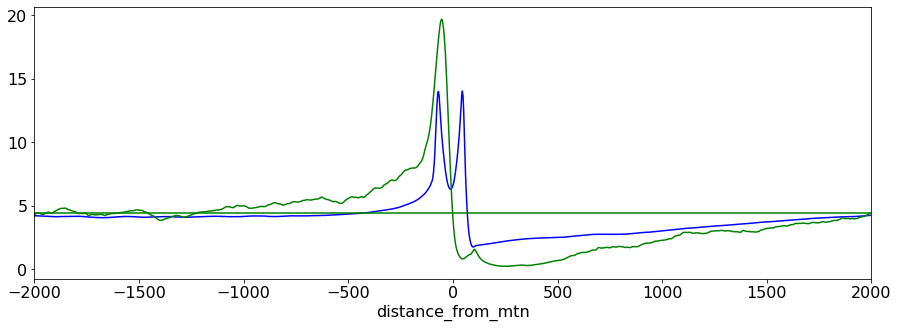

In [108]:
plt.figure(figsize=(15,5))
(0.5*crhs2*np.exp(xr.apply_ufunc(p,crhs2.r))).sum('r').plot(color="blue")
hrpr.plot(color='g')
plt.axhline(4.4,color='g')
plt.xlim(-2000,2000)

#plt.twinx()

#qmean_integ.plot(color='r')

## Decomposition

In [65]:
bins_wide=bins_wide=np.arange(0.,100.1,2.)
def density_slice(crh,slc):
    bins=bins_wide#[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    crhdensity = np.histogram(100*crh.sel(west_east=slice(*slc)),bins,density=True)[0]
    return bin_centers,crhdensity

def bins_slice(crh,pr,slc,lbl,slcpr=None,shift=0):
    if slcpr is None:
        slcpr=slc
    bins=bins_wide#[(bins_wide>float(100*crh.sel(west_east=slice(*slc)).min()))&(bins_wide<float(100*crh.sel(west_east=slice(*slc)).max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(100*np.array(crh.sel(west_east=slice(*slc))), bins)
    bin_means = [np.array(pr.sel(west_east=slice(*slcpr)))[digitized == i].mean()-shift for i in range(1, len(bins))]
    return bin_centers,np.nan_to_num(np.array(bin_means))

In [46]:
%%time
crh_density_x = []
pr_mean_x = []
bin_means_x = []
dx=40
xs = np.array(range(0,3271,dx)[:-1])
for x in xs:
    print(x,end=' ')
    bin_centers,crhdensity=density_slice(CRH_p[:-1],(x,x+dx))
    _,bin_means=bins_slice(CRH_p[:-1],pr_p[1:],(x,x+dx),'')
    crh_density_x.append(crhdensity)
    bin_means_x.append(bin_means)

rs = xr.DataArray(bin_centers,coords={'r':bin_centers},dims=['r'])
crh_density_x=xr.DataArray(np.array(crh_density_x),coords={'distance_from_mtn':3*(1635-xs),'r':bin_centers},dims=['distance_from_mtn','r'])
bin_means_x=xr.DataArray(np.array(bin_means_x),coords={'distance_from_mtn':3*(1635-xs),'r':bin_centers},dims=['distance_from_mtn','r'])


0 40 80 120 160 200 240 280 

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: Mean of empty slice.
  
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


320 360 400 440 480 520 560 600 640 680 720 760 800 840 880 920 960 1000 1040 1080 1120 1160 1200 1240 1280 1320 1360 1400 1440 1480 1520 1560 1600 1640 1680 1720 1760 1800 1840 1880 1920 1960 2000 2040 2080 2120 2160 2200 2240 2280 2320 2360 2400 2440 2480 2520 2560 2600 2640 2680 2720 2760 2800 2840 2880 2920 2960 3000 3040 3080 3120 3160 3200 CPU times: user 9.89 s, sys: 85.2 ms, total: 9.97 s
Wall time: 9.92 s


In [49]:
qmean_integ = (qmean_s*deta*dpdeta).sum('eta_level')

In [50]:
qsatmean_integ = (qsat_WRF(tmean_s,tmean_s.pressure)*deta*dpdeta)[:15].sum('eta_level')
lbd2=qsatmean_integ[3000]/qsatmean_integ

In [79]:
theory_crh_x=xr.DataArray(np.array((xr.apply_ufunc(pcrh_cap,rs/lbd2)/lbd2).coarsen(distance_from_mtn=40, boundary="trim").mean()).T,coords=bin_means_x.coords,dims=bin_means_x.dims)


(-3000.0, 3000.0)

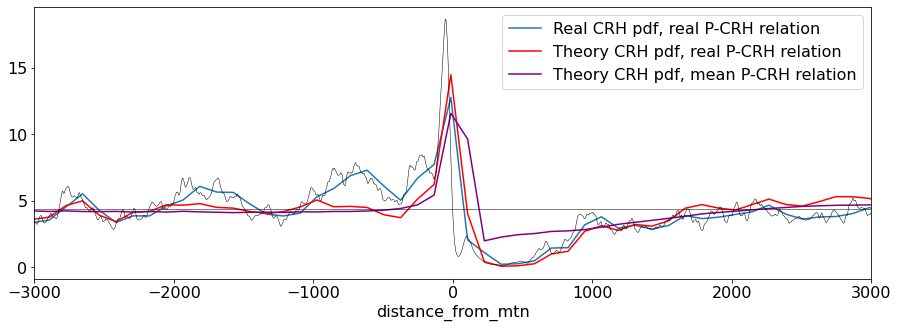

In [113]:
plt.figure(figsize=(15,5))
(2*crh_density_x*bin_means_x).sum('r').plot(label='Real CRH pdf, real P-CRH relation')
#(2*xr.apply_ufunc(pcrh_cap,rs)*bin_means_x).sum('r').plot(label='Mean CRH pdf, real P-CRH relation')
#(2*crh_density_x*np.exp(xr.apply_ufunc(p,rs))).sum('r').plot(label='Real CRH pdf, mean P-CRH relation')

(2*theory_crh_x*bin_means_x).sum('r').plot(label='Theory CRH pdf, real P-CRH relation',color='r')
(2*theory_crh_x*np.exp(xr.apply_ufunc(p,rs))).sum('r').plot(label='Theory CRH pdf, mean P-CRH relation',color='purple')
#

change_coords_sfc(pr_p.mean(['Time','south_north'])).plot(color='k',linewidth=0.5)

plt.axhline(4.4,color='k',linewidth=.5)
plt.legend()
plt.xlim(-3000,3000)

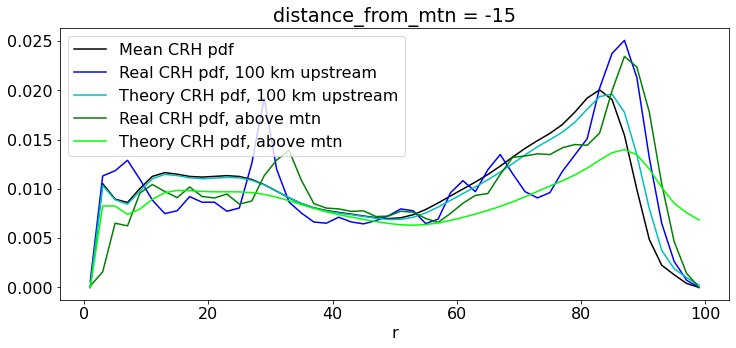

In [85]:
plt.figure(figsize=(12,5))

xr.apply_ufunc(pcrh_cap,rs).plot(label='Mean CRH pdf',color='k')
crh_density_x.sel(distance_from_mtn=-100,method='nearest').plot(label='Real CRH pdf, 100 km upstream',color='b')
theory_crh_x.sel(distance_from_mtn=-100,method='nearest').plot(label='Theory CRH pdf, 100 km upstream',color='c')

crh_density_x.sel(distance_from_mtn=0,method='nearest').plot(label='Real CRH pdf, above mtn',color='g')
theory_crh_x.sel(distance_from_mtn=0,method='nearest').plot(label='Theory CRH pdf, above mtn',color='lime')


plt.legend()
#plt.xlim(-3000,3000)

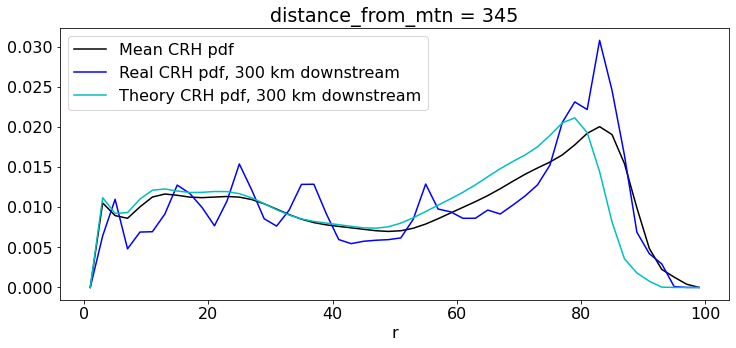

In [89]:
plt.figure(figsize=(12,5))

xr.apply_ufunc(pcrh_cap,rs).plot(label='Mean CRH pdf',color='k')
crh_density_x.sel(distance_from_mtn=300,method='nearest').plot(label='Real CRH pdf, 300 km downstream',color='b')
theory_crh_x.sel(distance_from_mtn=300,method='nearest').plot(label='Theory CRH pdf, 300 km downstream',color='c')


plt.legend()
#plt.xlim(-3000,3000)

# Convective timescale from Ahmed q-T closure

In [14]:
full_eta=hrchannel.ZNW.isel(Time=-1)
eta=hrchannel.ZNU.isel(Time=-1).load()
deta=xr.DataArray(-np.diff(full_eta),coords={'eta_level':np.array(eta)},dims=['eta_level']).load()
dpdeta = xr.DataArray(np.gradient(hrchannel.PB[-1,:,0,:],hrchannel.ZNU.isel(Time=-1),axis=0, edge_order=2),coords={'eta_level':np.array(eta),'distance_from_mtn':tmean_s.distance_from_mtn},dims=['eta_level','distance_from_mtn'])

In [59]:
PB=np.array(hrchannel.PB[-1,:,0,0])
n1=4;n2=16
Deltap = (PB[n1-1]+PB[n1])/2 - (PB[n2-1]+PB[n2])/2
tmean_s_hat = (tmean_s*deta*dpdeta)[n1:n2].sum('eta_level')/Deltap
tmean_s_hat_prime=tmean_s_hat-tmean_s_hat[3000]

In [103]:
tmean_p_hat = tmean_p[4:10].integrate('pressure')/(700-875)
tmean_p_hat_prime=tmean_p_hat-tmean_p_hat[3000]

In [20]:
hrcape=change_coords_sfc(hrchannel_capecin[0].mean(['Time','south_north']).load())

In [21]:
hrtauc=change_coords_sfc(hrchannel_capecin[0].mean(['Time','south_north']).load()/hrchannelprecip.mean(['Time','south_north']).load())

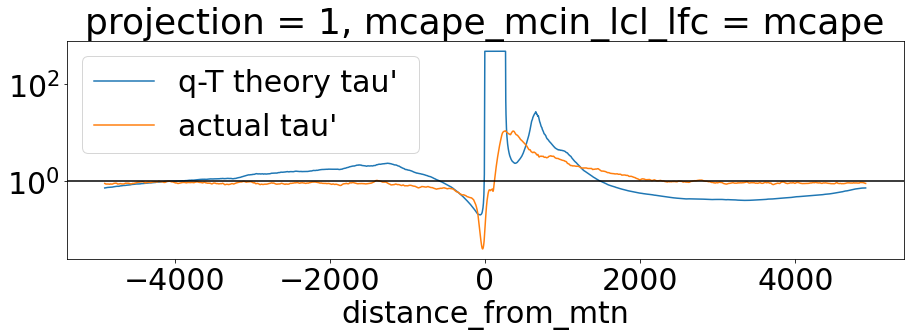

In [71]:
plt.figure(figsize=(15,4))
b1hat=0.05
tauprime_ahmed=(1/(1-1000*tmean_p_hat_prime/(6*1000*b1hat)*2.))
x1=np.where(tauprime_ahmed<=0)[0][0]
x2=np.where(tauprime_ahmed<=0)[0][-1]
tauprime_ahmed[x1:x2+1] = np.array(tauprime_ahmed[x1-1])+np.exp(np.arange(x2-x1+1)*np.array(np.log(tauprime_ahmed[x2+1])-np.log(tauprime_ahmed[x1-1]))/(x2-x1))
tauprime_ahmed.plot(label= "q-T theory tau' ")
(hrtauc/hrtauc[3000]).plot(label= "actual tau' ")
plt.axhline(1.,color='k')
#tmean_s_integ_prime.plot()
plt.yscale('log')
plt.legend()
#plt.xlim(-2000,2000)
#plt.ylim(-1000,1000)

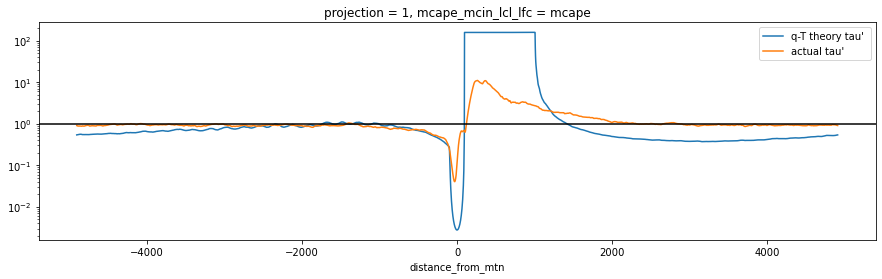

In [25]:
plt.figure(figsize=(15,4))
b1hat=0.05
tauprime_ahmed=(1/(1-1000*tmean_s_hat_prime/(6*1000*b1hat)*2.))
x1=np.where(tauprime_ahmed<=0)[0][0]
x2=np.where(tauprime_ahmed<=0)[0][-1]
tauprime_ahmed[x1:x2+1] = np.array(tauprime_ahmed[x1-1])+np.exp(np.arange(x2-x1+1)*np.array(np.log(tauprime_ahmed[x2+1])-np.log(tauprime_ahmed[x1-1]))/(x2-x1))
tauprime_ahmed.plot(label= "q-T theory tau' ")
(hrtauc/hrtauc[3000]).plot(label= "actual tau' ")
plt.axhline(1.,color='k')
#tmean_s_integ_prime.plot()
plt.yscale('log')
plt.legend()
#plt.xlim(-2000,2000)
#plt.ylim(-1000,1000)

# Moist seeds ?

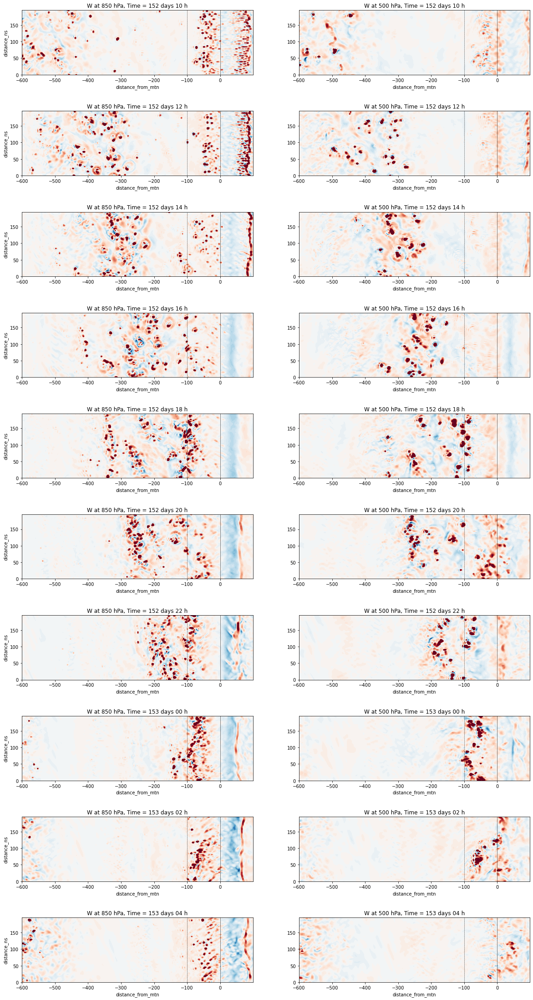

In [24]:
n=2;wscale=1
fig,axs = plt.subplots(20//n,2,figsize=(20,4*20//n))



for ax in axs.reshape(-1):
    ax.axvline(   0.,color='k',linewidth=0.5)
    ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.set_ylabel("Along-ridge distance (km)")
    
for i,axx in enumerate(axs):
    w_event.sel(pressure=850.).isel(Time=i*n).plot.contourf(ax=axx[0],levels=np.linspace(-wscale,wscale,41),add_colorbar=False)
    w_event.sel(pressure=500.).isel(Time=i*n).plot.contourf(ax=axx[1],levels=np.linspace(-wscale,wscale,41),add_colorbar=False)
    axx[1].set_ylabel("")   
    j = i*n+10
    axx[0].set_title("W at 850 hPa, Time = %i days %02i h"%(152+j//24,j%24))
    axx[1].set_title("W at 500 hPa, Time = %i days %02i h"%(152+j//24,j%24))

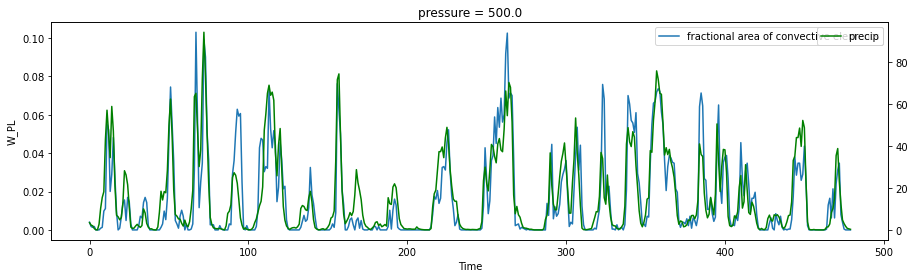

In [20]:
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax2=ax.twinx()
(w_20days>.5).sel(distance_from_mtn=slice(0,-100)).mean(['distance_ns','distance_from_mtn']).plot(ax=ax,label='fractional area of convective elements')
change_coords_sfc(hrchannelprecip_hourly[150*24:170*24]).sel(distance_from_mtn=slice(0,-100)).mean(['distance_from_mtn','south_north']).plot(ax=ax2,color='g',label='precip')
ax.legend()
ax2.legend()

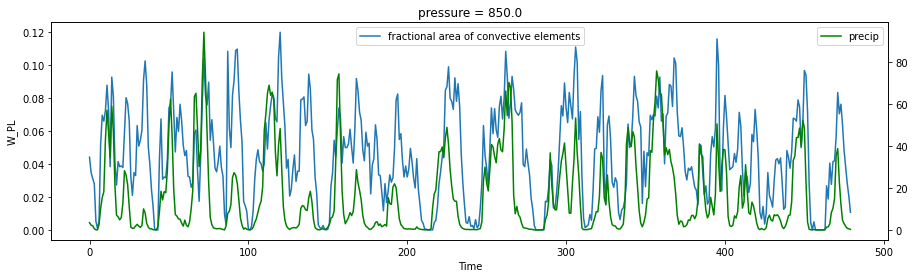

In [30]:
fig,ax = plt.subplots(1,1,figsize=(15,4))
ax2=ax.twinx()
(w_20days_850>.5).sel(distance_from_mtn=slice(0,-100)).mean(['distance_ns','distance_from_mtn']).plot(ax=ax,label='fractional area of convective elements')
change_coords_sfc(hrchannelprecip_hourly[150*24:170*24]).sel(distance_from_mtn=slice(0,-100)).mean(['distance_from_mtn','south_north']).plot(ax=ax2,color='g',label='precip')
ax.legend()
ax2.legend()

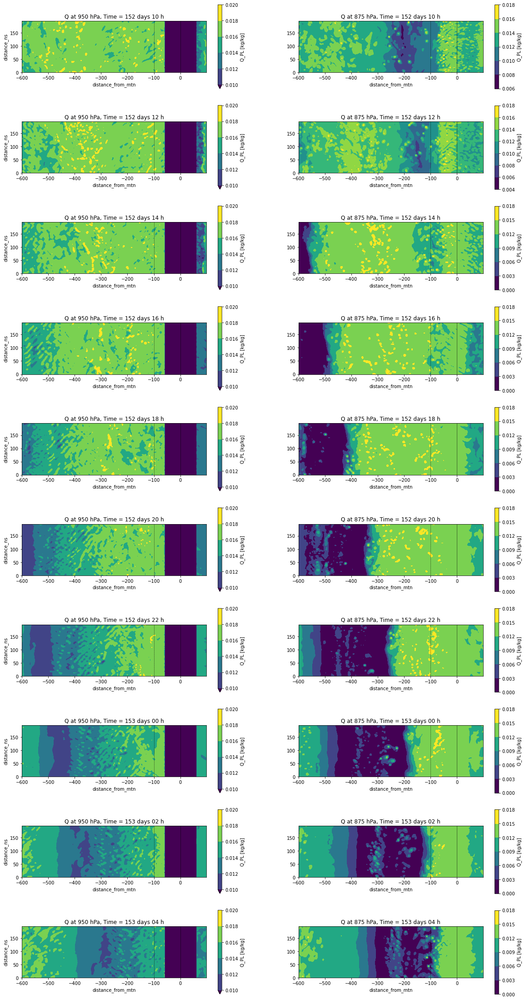

In [29]:
n=2;wscale=1
fig,axs = plt.subplots(20//n,2,figsize=(20,4*20//n))



for ax in axs.reshape(-1):
    ax.axvline(   0.,color='k',linewidth=0.5)
    ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.set_ylabel("Along-ridge distance (km)")
    
for i,axx in enumerate(axs):
    q_event.sel(pressure=950.).isel(Time=i*n).plot.contourf(ax=axx[0],levels=np.arange(0.01,0.021,0.002))
    q_event.sel(pressure=875.).isel(Time=i*n).plot.contourf(ax=axx[1])
    axx[1].set_ylabel("")   
    j = i*n+10
    axx[0].set_title("Q at 950 hPa, Time = %i days %02i h"%(152+j//24,j%24))
    axx[1].set_title("Q at 875 hPa, Time = %i days %02i h"%(152+j//24,j%24))

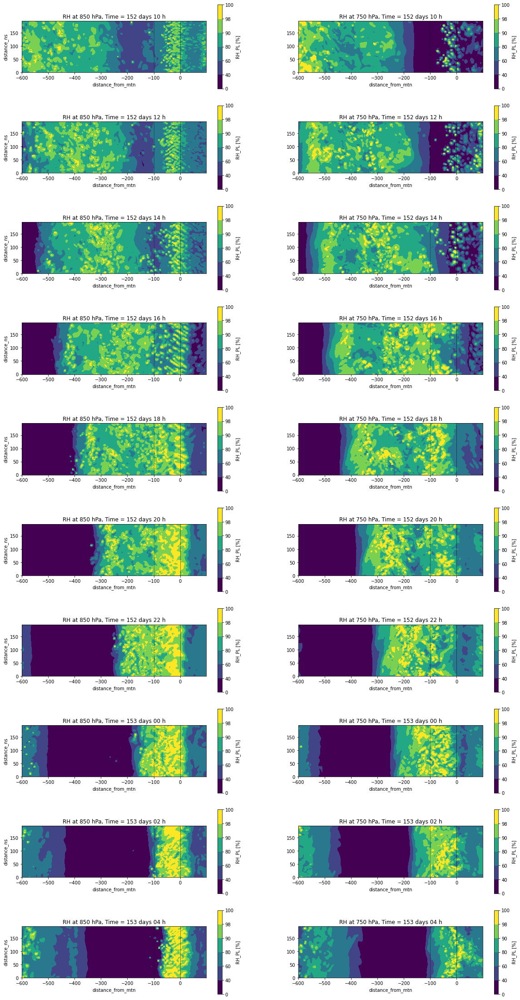

In [18]:
n=2;wscale=1
fig,axs = plt.subplots(20//n,2,figsize=(20,4*20//n))

rhlevs=[0.,40.,60.,80.,90.,98.,100.]

for ax in axs.reshape(-1):
    ax.axvline(   0.,color='k',linewidth=0.5)
    ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.set_ylabel("Along-ridge distance (km)")
    
for i,axx in enumerate(axs):
    np.maximum(0.,rh_event.sel(pressure=850.)).isel(Time=i*n).plot.contourf(ax=axx[0],levels=rhlevs)
    rh_event.sel(pressure=750.).isel(Time=i*n).plot.contourf(ax=axx[1],levels=rhlevs)
    axx[1].set_ylabel("")   
    j = i*n+10
    axx[0].set_title("RH at 850 hPa, Time = %i days %02i h"%(152+j//24,j%24))
    axx[1].set_title("RH at 750 hPa, Time = %i days %02i h"%(152+j//24,j%24))

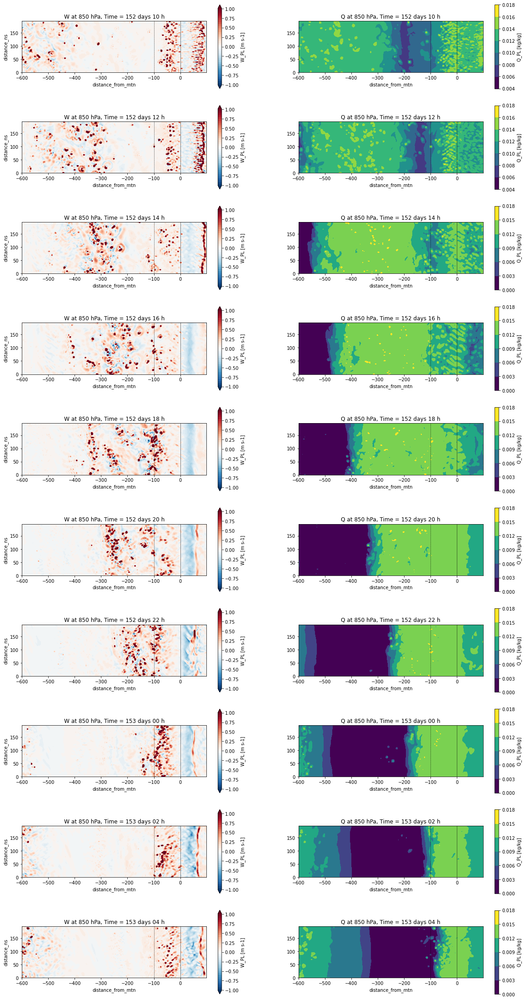

In [31]:
n=2;wscale=1
fig,axs = plt.subplots(20//n,2,figsize=(20,4*20//n))



for ax in axs.reshape(-1):
    ax.axvline(   0.,color='k',linewidth=0.5)
    ax.axvline(-100.,color='k',linewidth=0.5,linestyle='--')
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.set_ylabel("Along-ridge distance (km)")
    
for i,axx in enumerate(axs):
    w_event.sel(pressure=850.).isel(Time=i*n).plot.contourf(ax=axx[0],levels=np.linspace(-wscale,wscale,41))
    q_event.sel(pressure=850.).isel(Time=i*n).plot.contourf(ax=axx[1])
    axx[1].set_ylabel("")   
    j = i*n+10
    axx[0].set_title("W at 850 hPa, Time = %i days %02i h"%(152+j//24,j%24))
    axx[1].set_title("Q at 850 hPa, Time = %i days %02i h"%(152+j//24,j%24))

# Mean of instantaneous tau_c 

In [27]:
%%time
tau_instant = 2.26e6*hrchannel_capecin[0][200:800]/(hrchannelprecip[200:800]*8000) 
thresh=1.
tau_instant_mean1 = change_coords_sfc((tau_instant*(hrchannelprecip[200:800]>thresh)).sum(['Time','south_north'])/(hrchannelprecip[200:800]>thresh).sum(['Time','south_north']))
thresh=2.
tau_instant_mean2 = change_coords_sfc((tau_instant*(hrchannelprecip[200:800]>thresh)).sum(['Time','south_north'])/(hrchannelprecip[200:800]>thresh).sum(['Time','south_north']))

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in multiply
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in multiply
  return func(*(_execute_task(a, cache) for a in args))


CPU times: user 9.69 s, sys: 6.94 s, total: 16.6 s
Wall time: 24.9 s


Text(0, 0.5, 'seconds')

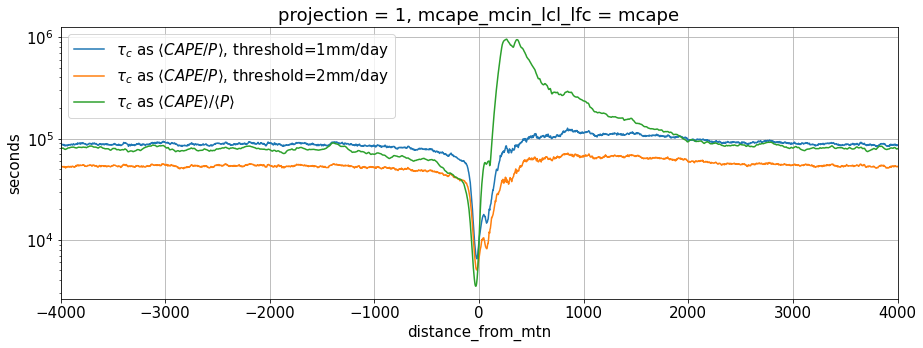

In [250]:
plt.figure(figsize=(15,5))
tau_instant_mean1.plot(label=r"$\tau_c$ as $\langle CAPE/P \rangle$, threshold=1mm/day")
tau_instant_mean2.plot(label=r"$\tau_c$ as $\langle CAPE/P \rangle$, threshold=2mm/day")
(2.26e6/8000*hrtauc).plot(label=r"$\tau_c$ as $\langle CAPE\rangle/\langle P \rangle$")
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(-4000,4000)
plt.ylabel('seconds')

In [38]:
def bins(pr,tau,bins_wide=None):
    if bins_wide is None:
        bins_wide=np.array([0,0.5,1,2,5,10,20,30]+list(np.arange(60,600,60)))
    bins=bins_wide[(bins_wide>=float(pr.min()))&(bins_wide<=float(pr.max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(np.array(pr), bins)
    bin_means = [np.nanmean(np.array(tau)[digitized == i]) for i in range(1, len(bins))]
    return bin_centers,bin_means

def density(pr,bins_wide=None):
    if bins_wide is None:
        bins_wide=np.array([0,0.5,1,2,5,10,20,30]+list(np.arange(60,600,60)))
    bins=bins_wide[(bins_wide>=float(pr.min()))&(bins_wide<=float(pr.max()))]
    bin_centers=(bins[1:]+bins[:-1])/2
    prdensity = np.histogram(pr,bins,density=True)[0]
    return bin_centers,prdensity

In [208]:
%%time
with warnings.catch_warnings():
    warnings.simplefilter("ignore",category=RuntimeWarning)
    prbins,taumeanbin = bins(hrchannelprecip[200:800],tau_instant)


CPU times: user 21.4 s, sys: 24.8 s, total: 46.2 s
Wall time: 29.7 s


In [209]:
%%time
with warnings.catch_warnings():
    warnings.simplefilter("ignore",category=RuntimeWarning)
    prbins,capemeanbin = bins(hrchannelprecip[200:800],hrchannel_capecin[0][200:800])


CPU times: user 17.8 s, sys: 20 s, total: 37.8 s
Wall time: 28.4 s


In [216]:
%time prbins,prpdf = density(hrchannelprecip[200:800])

CPU times: user 6.23 s, sys: 268 ms, total: 6.5 s
Wall time: 6.5 s


Text(0, 0.5, 'CAPE - J/kg')

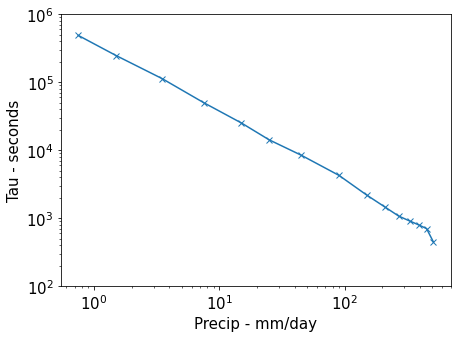

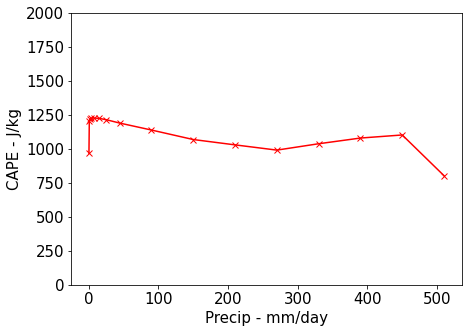

In [252]:
plt.figure(figsize=(7,5))
plt.plot(prbins,taumeanbin,marker='x')
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e2,1e6)
plt.xlabel('Precip - mm/day')
plt.ylabel('Tau - seconds')

plt.figure(figsize=(7,5))
plt.plot(prbins,capemeanbin,marker='x',color='r')
plt.ylim(0,2000)

plt.xlabel('Precip - mm/day')
plt.ylabel('CAPE - J/kg')

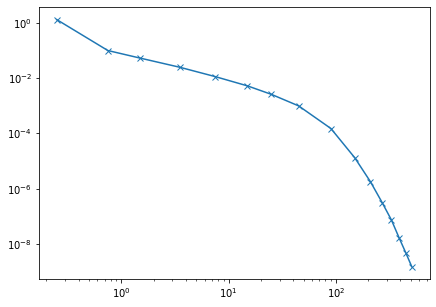

In [220]:
plt.figure(figsize=(7,5))
plt.plot(prbins,prpdf,marker='x')
plt.xscale('log')
plt.yscale('log')

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: divide by zero encountered in true_divide
  return func(*(_execute_task(a, cache) for a 

Text(0, 0.5, 'Tau - seconds')

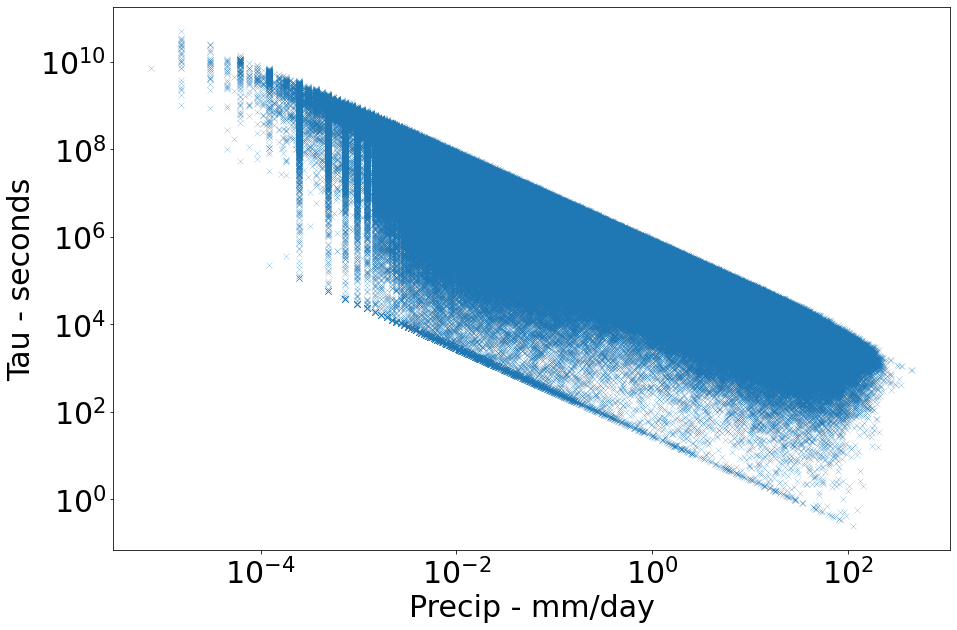

In [255]:
matplotlib.rcParams.update({'font.size': 30})
plt.figure(figsize=(15,10))
plt.scatter(hrchannelprecip[790:800],tau_instant[-10:],marker='x',linewidths=0.2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Precip - mm/day')
plt.ylabel('Tau - seconds')

Text(0, 0.5, 'Tau - seconds')

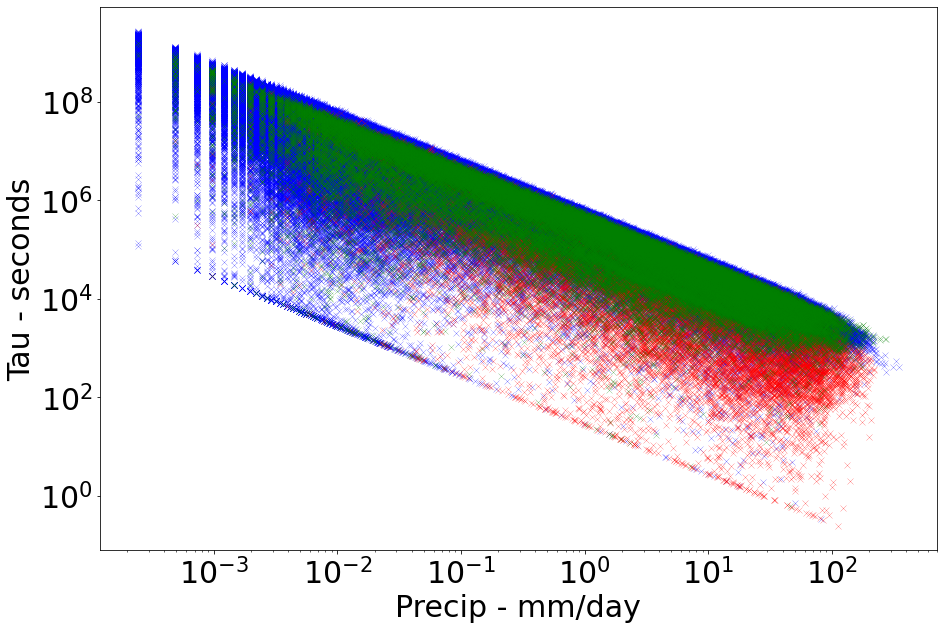

In [43]:
matplotlib.rcParams.update({'font.size': 30})
plt.figure(figsize=(15,10))
with warnings.catch_warnings():
    warnings.simplefilter("ignore",category=RuntimeWarning)
    plt.scatter(hrchannelprecip[790:800,:,2000:3000],tau_instant[-10:,:,2000:3000],marker='x',color='b',linewidths=0.2)
    plt.scatter(hrchannelprecip[790:800,:,1635:1670],tau_instant[-10:,:,1635:1670],marker='x',color='r',linewidths=0.2)
    plt.scatter(hrchannelprecip[790:800,:,1670:1800],tau_instant[-10:,:,1670:1800],marker='x',color='g',linewidths=0.2)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Precip - mm/day')
plt.ylabel('Tau - seconds')

Text(0, 0.5, 'Tau - seconds')

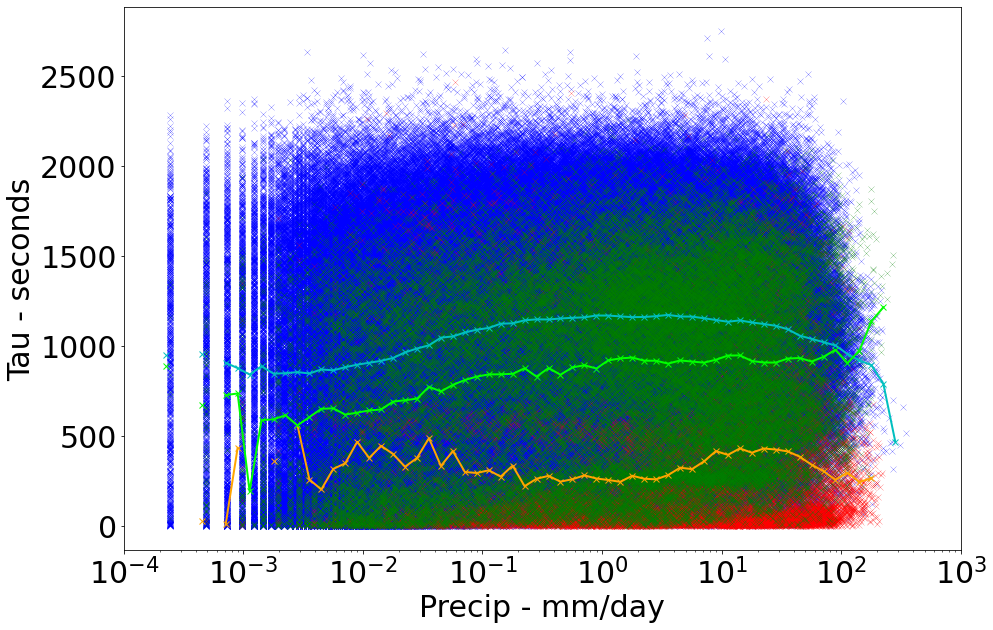

In [44]:
matplotlib.rcParams.update({'font.size': 30})
plt.figure(figsize=(15,10))
with warnings.catch_warnings():
    warnings.simplefilter("ignore",category=RuntimeWarning)
    plt.scatter(hrchannelprecip[790:800,:,2000:3000],hrchannel_capecin[0][790:800,:,2000:3000],marker='x',color='b',linewidths=0.2)
    plt.scatter(hrchannelprecip[790:800,:,1635:1670],hrchannel_capecin[0][790:800,:,1635:1670],marker='x',color='r',linewidths=0.2)
    plt.scatter(hrchannelprecip[790:800,:,1670:1800],hrchannel_capecin[0][790:800,:,1670:1800],marker='x',color='g',linewidths=0.2)
    
    prbins1,capebins1 = bins(hrchannelprecip[790:800,:,2000:3000],hrchannel_capecin[0][790:800,:,2000:3000],10**(np.arange(-4,3,0.1)))
    prbins2,capebins2 = bins(hrchannelprecip[790:800,:,1635:1670],hrchannel_capecin[0][790:800,:,1635:1670],10**(np.arange(-4,3,0.1)))
    prbins3,capebins3 = bins(hrchannelprecip[790:800,:,1670:1800],hrchannel_capecin[0][790:800,:,1670:1800],10**(np.arange(-4,3,0.1)))
    plt.plot(prbins1,capebins1,marker='x',linewidth=2,color='c')
    plt.plot(prbins2,capebins2,marker='x',linewidth=2,color='orange')
    plt.plot(prbins3,capebins3,marker='x',linewidth=2,color='lime')


plt.xscale('log')
plt.xlim(1e-4,1e3)
#plt.yscale('log')
plt.xlabel('Precip - mm/day')
plt.ylabel('Tau - seconds')

Text(0, 0.5, 'CAPE (J/kg)')

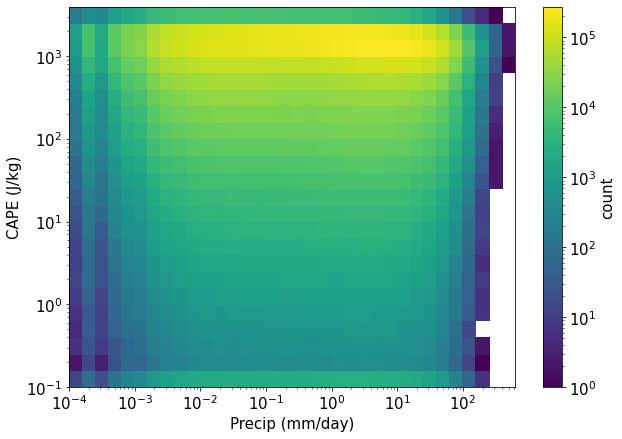

In [248]:
matplotlib.rcParams.update({'font.size':15})
plt.figure(figsize=(10,7))
h = plt.hist2d(np.array(hrchannelprecip[700:800]).reshape(-1),np.array(hrchannel_capecin[0][-100:]).reshape(-1),bins=(10**np.arange(-4,3,0.2),10**np.arange(-1,3.8,0.2)),norm=matplotlib.colors.LogNorm(),density=False)
plt.xscale('log')
plt.yscale('log')
plt.colorbar(h[3],label='count')
plt.xlabel('Precip (mm/day)')
plt.ylabel('CAPE (J/kg)')




# Proportion of precipitating times

In [16]:
hrpr=change_coords_sfc(hrchannelprecip[200:].mean(['Time','south_north']))

In [25]:
pr = change_coords_sfc(hrchannelprecip_hourly[-200:])
props=(pr>0.01).mean(['Time','south_north'])
props1=(pr>0.1).mean(['Time','south_north'])
props2=(pr>1).mean(['Time','south_north'])

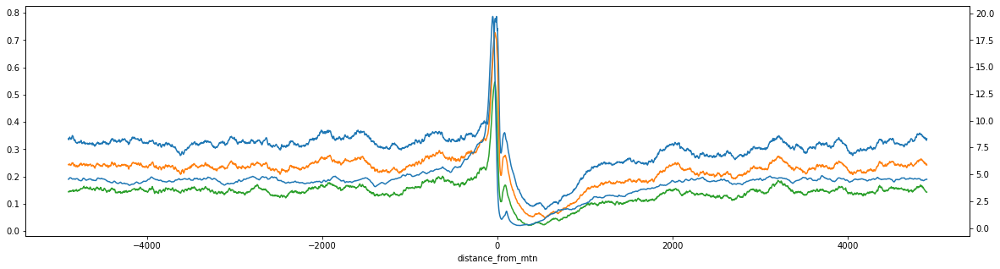

In [26]:
plt.figure(figsize=(20,5))
props.plot()
props1.plot()
props2.plot()
plt.twinx()
hrpr.plot()